# Part 9: Analysis of Tr3-56 cells

In this notebook, we will perform the detailed analysis of the unconventional CD8 T cells (Tgd cells and MAIT cells) and CD4 Temra cells, which we believe correspond to the previously reported Tr3-56 cells. See the original publication: [Terrazzano et al., 2020, Nat. Metabolism](https://www.nature.com/articles/s42255-020-0173-1).  

In [1]:
source("diabetes_analysis_v07.R")

Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘MatrixGenerics’


The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, rowCumprods,
    rowCumsums, rowDiffs, rowIQRDiffs, rowIQRs, rowLogSumExps,
    rowMadDiffs, rowMads, rowMaxs, rowMeans2, rowMedians, rowMins,
    rowOrderStats, rowProds, rowQuantiles, rowRanges


Attaching package: ‘ggtree’


The following object is masked from ‘package:ggpubr’:

    rotate


The following object is masked from ‘package:reshape’:

    expand


The following object is masked from ‘package:tidyr’:

    expand


The following object is masked from ‘package:IRanges’:

    collapse


The following object is masked from ‘package:S4Vectors’:

    expand


The following object is masked from ‘package:Matrix’:

    expand




In [2]:
plan("multisession")

# Unconventional CD8 T cells

## Tr3-56 published data

We will download the Tr3-56 dataset and the associated metadata from GEO using the GEOquery package.

In [7]:
library(GEOquery)

Setting options('download.file.method.GEOquery'='auto')

Setting options('GEOquery.inmemory.gpl'=FALSE)



In [8]:
gset <- getGEO("GSE106082", GSEMatrix =TRUE, getGPL=TRUE, AnnotGPL=TRUE)

Found 1 file(s)

GSE106082_series_matrix.txt.gz

Annotation GPL not available, so will use submitter GPL instead



In [9]:
library(readr)

In [10]:
metadata <- data.frame(geo_id = gset$GSE106082_series_matrix.txt.gz$geo_accession,
                       cell_type = gset$GSE106082_series_matrix.txt.gz$`characteristics_ch1.1`
                       )

The matrix was downloaded separately from GEO, so we will load it.

In [31]:
mtx_tr356  <- read_csv("../../240218_VN_Diabetes_V05/data/published_data/Terrazzano_2020/tr356_df_sum.csv")

New names:
• `` -> `...1`
Rows: 20185 Columns: 14
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (1): SYMBOL
dbl (13): ...1, GSM2829263, GSM2829264, GSM2829265, GSM2829266, GSM2829267, ...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [32]:
mtx_tr356$`...1`  <- NULL

In [33]:
mtx_tr356  <- mtx_tr356  %>% column_to_rownames("SYMBOL")

In [34]:
mtx_tr356

,GSM2829263,GSM2829264,GSM2829265,GSM2829266,GSM2829267,GSM2829268,GSM2829269,GSM2829270,GSM2829271,GSM2829272,GSM2829273,GSM2829274
A1BG,4.544800,4.882145,4.907298,4.596140,4.605788,4.683674,5.221959,4.804293,4.955937,5.185575,5.015142,4.757583
A1CF,3.774098,3.759367,3.850465,3.735124,3.608670,3.628318,3.557054,3.555598,3.949272,4.006079,3.774020,3.284946
A2M,11.862090,9.336823,10.995440,10.445450,6.410524,9.812895,7.742822,7.747147,8.218060,9.741845,11.048080,10.306250
A2ML1,5.742468,6.357774,5.694543,5.473132,5.229849,5.792858,5.598923,5.852253,5.161205,5.162116,5.502660,4.724673
A3GALT2,4.776125,5.317615,4.755690,4.985246,4.823136,4.758044,4.816776,5.256840,4.975574,4.560531,4.971125,4.878799
A4GALT,3.388180,3.838186,3.463689,3.545921,3.690346,3.766155,3.606695,3.768604,3.618593,3.442958,3.223899,3.567720
A4GNT,5.066483,5.482936,4.696154,4.685892,4.532978,4.260944,5.260707,4.657770,4.834064,4.477656,4.134744,4.403499
AAAS,11.217150,10.195850,10.633160,12.039920,11.120950,11.348270,11.414740,10.613370,11.319590,12.366890,12.556400,12.550780
AACS,5.932485,8.543219,7.625425,5.798914,6.403430,6.301892,6.878719,6.896776,6.220037,5.116759,5.846683,5.842064
AACSP1,6.011742,5.394643,5.676650,5.503352,5.544027,5.536304,5.436848,5.260375,5.357204,5.342594,5.629070,5.474391


We will now use the SingleR package that we used in parts 2 and 3 to annotate cells by the TR3/56 scores. For more information about the package, visit the link [SingleR](https://bioconductor.org/packages/release/bioc/vignettes/SingleR/inst/doc/SingleR.html). The reference data needs to be formated properly.

In [ ]:
mtx_tr356  <- mtx_tr356  %>% mutate_all(.funs = as.numeric)

In [ ]:
ref_tr3_56 <- list(matrix = mtx_tr356[,c(1:6,10:12)], 
                       labels = metadata$cell_type[c(1:6,10:12)])


In [44]:
ref_tr3_56$labels

[1] "cell subset: TR3-56" "cell subset: TR3-56" "cell subset: TR3-56"
[4] "cell subset: NK"     "cell subset: NK"     "cell subset: NK"    
[7] "cell subset: CD8+"   "cell subset: CD8+"   "cell subset: CD8+"

In [45]:
ref_tr3_56$matrix  <- as.matrix(ref_tr3_56$matrix)

In [46]:
head(rownames(ref_tr3_56$matrix))

[1] "A1BG"    "A1CF"    "A2M"     "A2ML1"   "A3GALT2" "A4GALT"

We have the reference data ready so we will load the preprocessed CD8 full dataset.

In [ ]:
cd8_l1_full_filt  <- readRDS("../data/processed/L1/cd8_l1_full_filt.rds")

Now proceed with the SingleR.

In [ ]:
pred <- SingleR(test = cd8_l1_full_filt@assays$RNA@counts, 
                ref=ref_tr3_56$matrix, 
                labels=ref_tr3_56$labels, 
                fine.tune = T, num.threads = 4
       )

In [48]:
pred

DataFrame with 95229 rows and 4 columns
                                                  scores            labels
                                                <matrix>       <character>
AAACCTGAGATATGCA-1_1_1_1_1_1 0.280852:0.0867496:0.139094 cell subset: CD8+
AAACCTGAGGTGACCA-1_1_1_1_1_1 0.242992:0.1671843:0.234868 cell subset: CD8+
AAACCTGAGTACGATA-1_1_1_1_1_1 0.272481:0.0743748:0.144768 cell subset: CD8+
AAACCTGAGTCGCCGT-1_1_1_1_1_1 0.273309:0.1039935:0.163142 cell subset: CD8+
AAACCTGCATCGTCGG-1_1_1_1_1_1 0.229812:0.0694385:0.111234 cell subset: CD8+
...                                                  ...               ...
TTTGTCACATGTAGTC-1            0.125517:0.225515:0.109110   cell subset: NK
TTTGTCAGTAGGCATG-1            0.234912:0.134102:0.171829 cell subset: CD8+
TTTGTCAGTGCACTTA-1            0.195212:0.234922:0.196008   cell subset: NK
TTTGTCAGTTCCACAA-1            0.274434:0.150048:0.163927 cell subset: CD8+
TTTGTCATCTTACCTA-1            0.224710:0.123677:0.184610 cel

Add the SingleR annotations to the Seurat object for visualization.

In [ ]:
cd8_l1_full_filt$singler  <- pred$labels

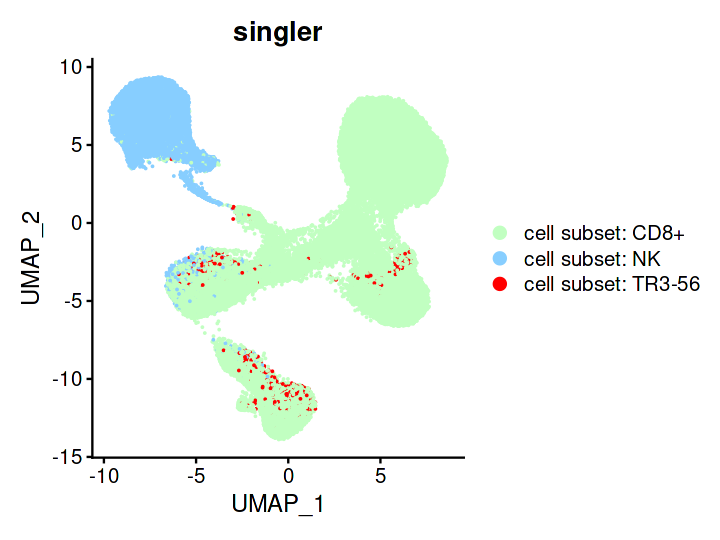

In [81]:
options(repr.plot.width = 6, repr.plot.height = 4.5)
DimPlot(cd8_l1_full_filt, group.by = "singler", shuffle = T, cols = c("darkseagreen1","skyblue1","red"))

We will quantify these annotations, i.e. we will calculate the percentages of TR3/56 cells vs. other cell types in each cluster. 

In [128]:
tr356_df  <- data.frame(annotation = cd8_l1_full_filt$annot2,
                    pred = cd8_l1_full_filt$singler)

In [129]:
tr356_df <- test %>% group_by(annotation, pred) %>% 
  summarise(n = n()) %>%
  mutate(freq = n / sum(n))

`summarise()` has grouped output by 'annotation'. You can override using the
`.groups` argument.


In [54]:
tr356_df

annotation,pred,n,freq
CD8 NK cells---NK cells,cell subset: CD8+,238,0.0112534872
CD8 NK cells---NK cells,cell subset: NK,20907,0.9885573786
CD8 NK cells---NK cells,cell subset: TR3-56,4,0.0001891342
CD8 T cells---Naive,cell subset: CD8+,25869,1.0000000000
CD8 T cells---Proliferating,cell subset: CD8+,1987,0.9905284148
CD8 T cells---Proliferating,cell subset: NK,11,0.0054835494
CD8 T cells---Proliferating,cell subset: TR3-56,8,0.0039880359
CD8 T cells---Tcm,cell subset: CD8+,6387,0.9937762564
CD8 T cells---Tcm,cell subset: NK,1,0.0001555936
CD8 T cells---Tcm,cell subset: TR3-56,39,0.0060681500


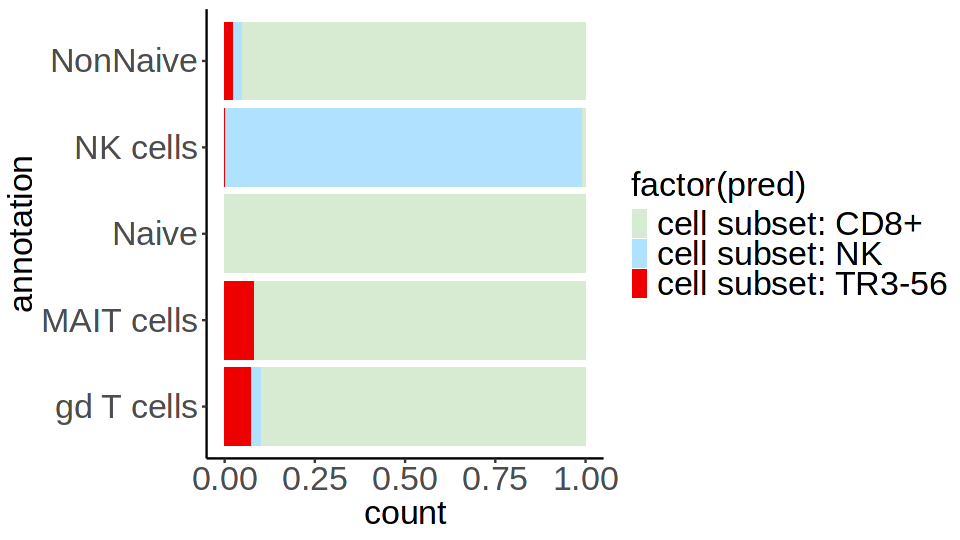

In [131]:
options(repr.plot.width = 8, repr.plot.height = 4.5)
ggplot(test) +
  aes(x = annotation, fill = factor(pred)) +
  geom_bar(position = "fill") + 
theme_classic() + 
ggtheme() +
coord_flip() + 
scale_fill_manual(values = c("#d6ebd2ff", "lightskyblue1", "red2"))
#scale_fill_manual(values = c("grey","#74bc68ff", "dodgerblue3", "red2"))

Next, we will summarize the TR3-56 scores. First, we will see the scores per cluster and then the scores for T1D vs. healthy. 

In [83]:
cd8_l1_full_filt$score_tr356  <- pred$scores[,3]

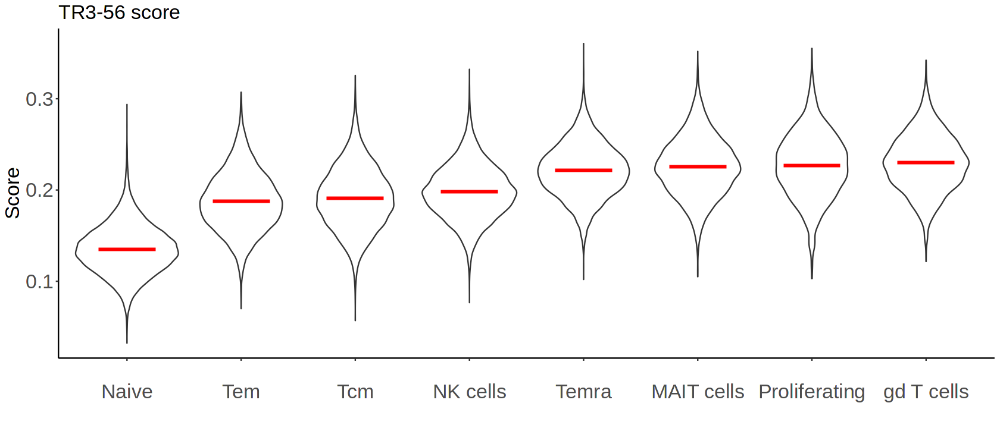

In [58]:
options(repr.plot.width = 14, repr.plot.height = 6)
data.frame(Score = cd8_l1_full_filt$score_tr356,
                  Annotation = gsub(cd8_l1_full_filt$annotations_l2, pattern = "---", replacement = "\n"))  %>% 
mutate(Annotation = gsub(Annotation, pattern = "CD8 T cells", replacement = ""))  %>% 
mutate(Annotation = gsub(Annotation, pattern = "CD8 Unconventional T cells", replacement = ""))  %>% 
mutate(Annotation = gsub(Annotation, pattern = "CD8 NK cells", replacement = ""))  %>% 
ggplot(aes(x = fct_reorder(Annotation, Score), y = Score)) +
  geom_violin() + 
  stat_summary(fun = "mean",
               geom = "crossbar", 
               width = 0.5,
               colour = "red") + ggtitle("TR3-56 score") + theme_classic() + ggtheme() + xlab("")

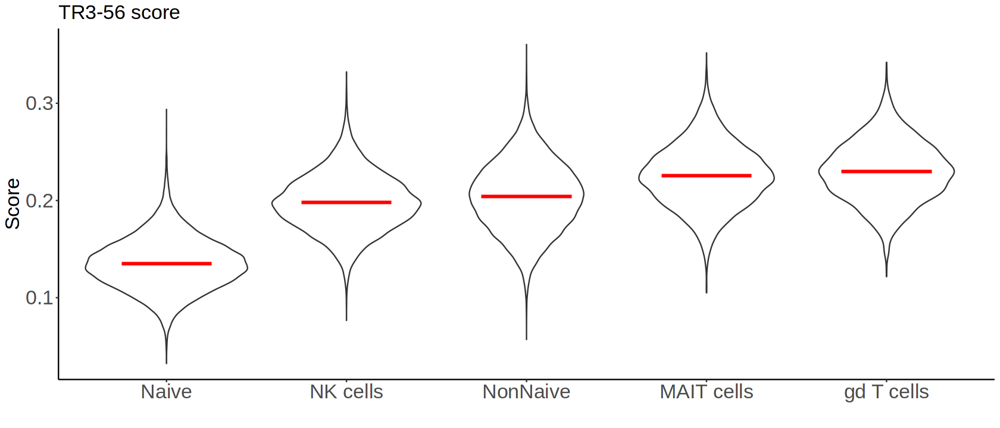

In [77]:
data.frame(Score = cd8_l1_full_filt$score_tr356,
                  Annotation = gsub(cd8_l1_full_filt$annotations_l2, pattern = "---", replacement = ""))  %>% 
mutate(Annotation = gsub(Annotation, pattern = "CD8 T cells", replacement = ""))  %>% 
mutate(Annotation = gsub(Annotation, pattern = "CD8 Unconventional T cells", replacement = ""))  %>% 
mutate(Annotation = gsub(Annotation, pattern = "CD8 NK cells", replacement = ""))  %>% 
mutate(annot2 = case_when(Annotation %in% c("Tem","Tcm","Temra","Proliferating") ~ "NonNaive", 
                          TRUE ~ Annotation))  %>% 
ggplot(aes(x = fct_reorder(annot2, Score), y = Score)) +
  geom_violin() + 
  stat_summary(fun = "mean",
               geom = "crossbar", 
               width = 0.5,
               colour = "red") + ggtitle("TR3-56 score") + theme_classic() + ggtheme() + xlab("")
ggsave("../figures/cd356_score.svg", width = 4, height = 3.5)

In [90]:
cd8_l1_full_filt@meta.data  <- cd8_l1_full_filt@meta.data  %>% 
mutate(Annotation = gsub(cd8_l1_full_filt$annotations_l2, pattern = "---", replacement = ""))  %>% 
mutate(Annotation = gsub(Annotation, pattern = "CD8 T cells", replacement = ""))  %>% 
mutate(Annotation = gsub(Annotation, pattern = "CD8 Unconventional T cells", replacement = ""))  %>% 
mutate(Annotation = gsub(Annotation, pattern = "CD8 NK cells", replacement = ""))  %>% 
mutate(annot2 = case_when(Annotation %in% c("Tem","Tcm","Temra","Proliferating") ~ "NonNaive", 
                          TRUE ~ Annotation)) 

## Characterization of subsets for comparison with flow cytometry data

In [91]:
cd8_l1_full_filt$annotations_l2_sample  <- paste(cd8_l1_full_filt$annot2, cd8_l1_full_filt$Sample_ID)

In [93]:
# Extract the dataframe with seurat metadata
seurat_meta_data <- cd8_l1_full_filt@meta.data
seurat_meta_data$sample <- seurat_meta_data$annotations_l2_sample

# Select genes of interest
# The script only works for two or more genes, you can't select just one!
gene_hits <- c("NCAM1", "TRGC1", "CD8A", "CD8B", 
               "FCGR3A","CD3D","CD3G","CD3Z")

# By default the percentage of calculated cells is computed for whole sample
# Optionally, you can select a cluster that you're interested in by subsetting:
# pbmc_small <- subset(pbmc_small, seurat_clusters == 3)


# Now we will calculate the percentage of expressing cells for each sample and we will merge the resulting dataframes
expr_data4 <- data.frame(genes = gene_hits)

# We will need a function that will convert any non-zero count to value 1
fns_replace <- function(x){ifelse(x>0,1,0)}

for(j in (pull(seurat_meta_data, sample)  %>% unique)){
  
  # subset only selected cell type
  seu_sub_sample <- subset(cd8_l1_full_filt, annotations_l2_sample == j) 
  
  # select the rows corresponding to genes of interest
  index_subset <- which(rownames(seu_sub_sample@assays$RNA@counts) %in% gene_hits)
  
  # create a dataframe with genes of interest and cells of interest
  expr_data <- as.data.frame(seu_sub_sample@assays$RNA@counts[index_subset,]) 
  
  # convert expression to binary values
  expr_data2 <- expr_data %>% mutate(across(.fns = fns_replace))
  rownames(expr_data2) <- rownames(expr_data)
  
  # calculate average expresion (percentage of cells expressing the gene)
  expr_data3 <- rowMeans(expr_data2)
  
  # add zeroes in cases of no expression
  for(k in gene_hits){
    if(k %in% names(expr_data3) == F){expr_data3[[k]] <- 0}
  }
  
  expr_data3 <- as.data.frame(expr_data3)
  colnames(expr_data3) <- j
  expr_data3$genes <- rownames(expr_data3)
  
  # final dataframe with values in correct order (all cell type, loop results)
  expr_data4 <- left_join(expr_data4, expr_data3, by="genes")
  
}

# Now we have the whole dataframe, we just need to tidy it a bit, add metadata and visualize

expr_data5 <- as.data.frame(t(expr_data4))
colnames(expr_data5) <- expr_data5[1,]
expr_data5 <- expr_data5[2:nrow(expr_data5),]
expr_data5$sample <- rownames(expr_data5)
expr_data5 <- expr_data5 %>% pivot_longer( !sample, names_to = "gene", values_to = "pct_express")

# Add metadata per sample - select those that you will use in the plot below
md_to_join <- seurat_meta_data %>% dplyr::select(sample = annotations_l2_sample)  %>% 
unique() %>% mutate(sample = as.character(sample))
md2 <- left_join(expr_data5, md_to_join, by = "sample") %>% ungroup %>% unique



Warning message:
“There was 1 warning in `mutate()`.
ℹ In argument: `across(.fns = fns_replace)`.
Caused by warning:
! Using `across()` without supplying `.cols` was deprecated in dplyr 1.1.0.
ℹ Please supply `.cols` instead.”


In [94]:
md2

sample,gene,pct_express
Naive 150,NCAM1,0.000000000
Naive 150,TRGC1,0.005069708
Naive 150,CD8A,0.879594423
Naive 150,CD8B,0.983523447
Naive 150,FCGR3A,0.000000000
Naive 150,CD3D,0.923954373
Naive 150,CD3G,0.641318124
Naive 150,CD3Z,0.000000000
MAIT cells 150,NCAM1,0.0
MAIT cells 150,TRGC1,0.5


In [95]:
md2 %>% 
mutate(Sample_ID = substr(sample,nchar(sample)-3,nchar(sample)))  %>% 
mutate(population = substr(sample,1,nchar(sample)-3)) 

sample,gene,pct_express,Sample_ID,population
Naive 150,NCAM1,0.000000000,150,Naive
Naive 150,TRGC1,0.005069708,150,Naive
Naive 150,CD8A,0.879594423,150,Naive
Naive 150,CD8B,0.983523447,150,Naive
Naive 150,FCGR3A,0.000000000,150,Naive
Naive 150,CD3D,0.923954373,150,Naive
Naive 150,CD3G,0.641318124,150,Naive
Naive 150,CD3Z,0.000000000,150,Naive
MAIT cells 150,NCAM1,0.0,150,MAIT cells
MAIT cells 150,TRGC1,0.5,150,MAIT cells


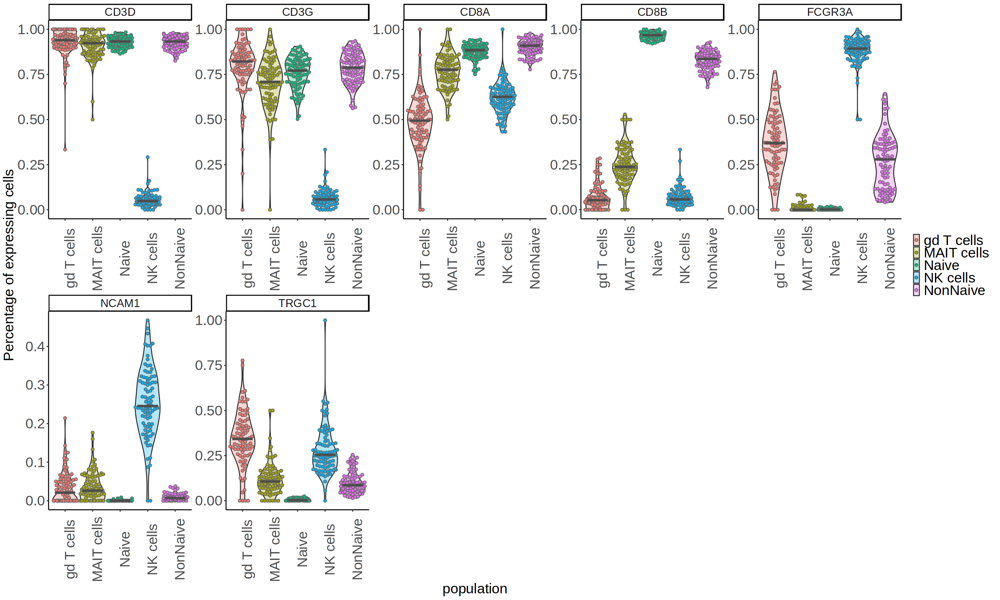

In [133]:
options(repr.plot.width = 20, repr.plot.height = 12)

md2 %>% 
dplyr::filter(gene != "CD3Z")  %>% 
pivot_wider(names_from = "gene", values_from = "pct_express", values_fill = "0")  %>% 
pivot_longer(cols = c(2:8), names_to = "gene", values_to = "pct_express")  %>% 
mutate(Sample_ID = substr(sample,nchar(sample)-3,nchar(sample)))  %>% 
mutate(population = substr(sample,1,nchar(sample)-3))  %>% 
ggplot(aes(x = population, y = as.numeric(pct_express))) + 
 geom_violin(alpha = 0.3, aes(fill = population), scale = "width") + 
 
geom_beeswarm(size = 1.5, aes(fill = population), cex = 2, 
                shape = 21, color = "grey40",corral = "random") +
 stat_summary(fun = "median",
               geom = "crossbar", 
               width = 0.75,
               color = "grey30") +
 #stat_compare_means(label = "p.format", comparisons = list(c(1,2))) +
  theme_minimal() + 
  facet_wrap(~gene, scales = "free", ncol = 5) + 
  ylim(c(0,NA)) +
#ggpubr::stat_compare_means()+
  ylab("Percentage of expressing cells") +
  theme_classic() + ggtheme() +
 theme(legend.title = element_blank(),axis.text.x = element_text(angle = 90)) 

ggsave("../figures/scRNAseq_gd_characterization.svg", width = 13, height = 9)

In [ ]:
options(repr.plot.width = 15, repr.plot.height = 8)

md2 %>% 
pivot_wider(names_from = "gene", values_from = "pct_express", values_fill = "0")  %>% 
pivot_longer(cols = c(2:9), names_to = "gene", values_to = "pct_express")  %>% 
mutate(Sample_ID = substr(sample,nchar(sample)-3,nchar(sample)))  %>% 
mutate(population = substr(sample,1,nchar(sample)-3))  %>% 
ggplot(aes(x = population, y = as.numeric(pct_express))) + 
  geom_boxplot(outlier.shape = NA) +
  geom_dotplot(binaxis='y', stackdir='center', dotsize=0) + 
  geom_jitter(position=position_jitter(0.2), size = 2, aes(color = factor(population))) +
  theme_minimal() + 
  facet_wrap(~gene, scales = "free", ncol = 5) + 
  ylim(c(0,NA)) +
ggpubr::stat_compare_means()+
  ylab("Percentage of expressing cells") +
  theme(legend.title = element_blank())

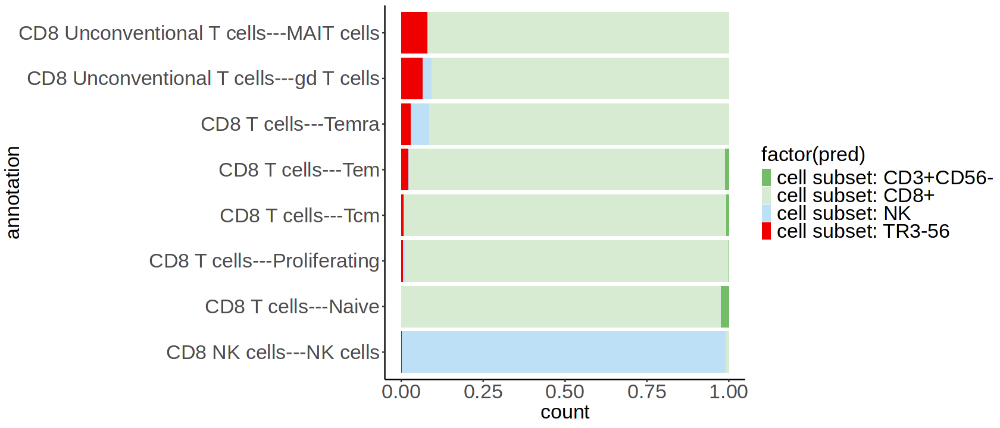

## Analysis of Unconventional CD8 cluster

In [1]:
gd  <- readRDS("../../240218_VN_Diabetes_V05/data/processed/L2/cd8_l2_unc.rds")

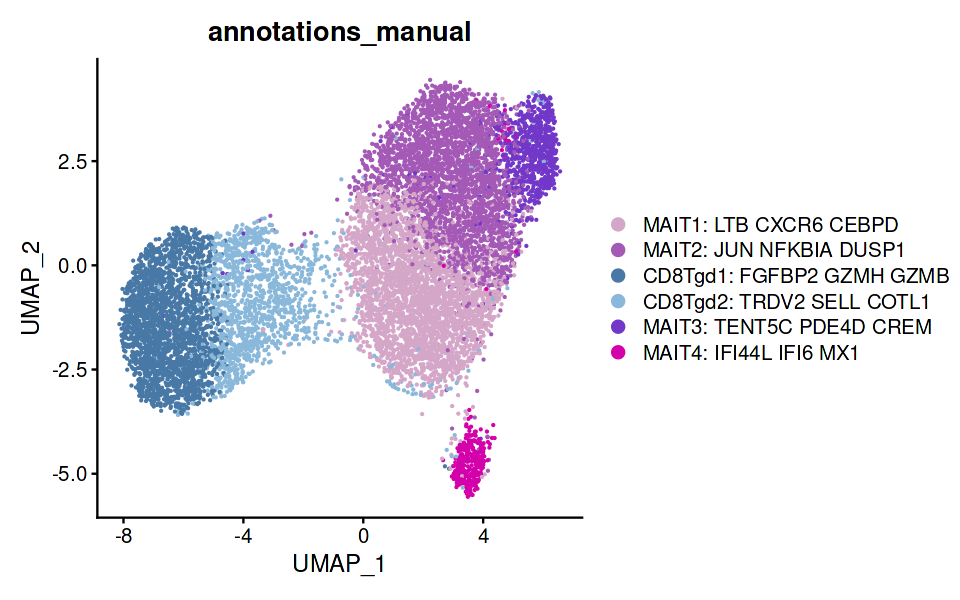

In [42]:
options(repr.plot.width = 8, repr.plot.height = 5)
DimPlot(gd, group.by = "annotations_manual", cols = gd@misc$cols_annotations)

In [43]:
df4  <- create_df4(gd)

`summarise()` has grouped output by 'Sample_ID'. You can override using the
`.groups` argument.
Joining with `by = join_by(Sample_ID)`
Joining with `by = join_by(Sample_ID)`


In [44]:
df4

Sample_ID,annotations_manual,freq,Condition,Condition2,Disease,Sex,Age,Age_group,Patient_ID,Time,Experiment_ID
150,MAIT1: LTB CXCR6 CEBPD,0.50000000,Dia T0,Part_remission_1,Dia,M,3.7,1,105,T0,Exp08
150,MAIT2: JUN NFKBIA DUSP1,0.50000000,Dia T0,Part_remission_1,Dia,M,3.7,1,105,T0,Exp08
150,CD8Tgd1: FGFBP2 GZMH GZMB,0.00000000,Dia T0,Part_remission_1,Dia,M,3.7,1,105,T0,Exp08
150,CD8Tgd2: TRDV2 SELL COTL1,0.00000000,Dia T0,Part_remission_1,Dia,M,3.7,1,105,T0,Exp08
150,MAIT3: TENT5C PDE4D CREM,0.00000000,Dia T0,Part_remission_1,Dia,M,3.7,1,105,T0,Exp08
150,MAIT4: IFI44L IFI6 MX1,0.00000000,Dia T0,Part_remission_1,Dia,M,3.7,1,105,T0,Exp08
153,MAIT1: LTB CXCR6 CEBPD,0.33333333,Dia T0,Part_remission_0,Dia,F,1.4,1,106,T0,Exp08
153,MAIT2: JUN NFKBIA DUSP1,0.16666667,Dia T0,Part_remission_0,Dia,F,1.4,1,106,T0,Exp08
153,CD8Tgd1: FGFBP2 GZMH GZMB,0.33333333,Dia T0,Part_remission_0,Dia,F,1.4,1,106,T0,Exp08
153,CD8Tgd2: TRDV2 SELL COTL1,0.16666667,Dia T0,Part_remission_0,Dia,F,1.4,1,106,T0,Exp08


In [51]:
p5  <-   df4  %>% 
filter(Experiment_ID %in% c("Exp16", "Exp18", "Exp19", "Exp20"))  %>% 
  ggplot(aes(x = Condition, y = freq*100)) + # you can change the x to whatever variable you're interested in
   geom_violin(alpha = 0.3, aes(fill = Condition)) +
  stat_summary(fun = "median",
               geom = "crossbar", 
               width = 0.75,
               color = "grey30") +
   scale_fill_manual(values = c("#1874cdff",  "#ee6363ff", "#c41515ff","#eeb4b4ff")) +
scale_color_manual(values = c("dodgerblue3",  "#e54c4cff", "#aa2a2aff","#e88989ff")) +
geom_beeswarm(size = 3, cex = 3, 
              color = "black", method = "center",
             aes(fill = Condition), shape = 21) +
   facet_wrap(~annotations_manual, scales = "free", ncol = 9) +
  ylab("Frequency") +
  xlab("Condition") +
  theme_classic() +
ggtheme() +
ggpubr::stat_compare_means(label.x= 1.5, 
                           size = 7, vjust = -1, label = "p.format", comparisons = list(c(1,2)))+
ggtheme() +
 scale_y_continuous(limits = c(0,NA), expand = c(0.05,0,0,10)) +
  theme(strip.background = element_blank(), panel.grid = element_blank()) + 
  theme(axis.text = element_text(color = "black"),
        axis.text.x = element_text(angle = 90),
       axis.line = element_line(color = "black", size = 0.5),
        axis.ticks.x = element_blank()) + NoLegend() + ggtitle("Final data all groups")
ncols = length(levels(factor(df4$annotations_manual)))

Warning message in wilcox.test.default(c(37.037037037037, 55.4913294797688, 41.6666666666667, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(40.7407407407407, 0, 2.77777777777778, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(5.55555555555556, 31.7919075144509, 8.33333333333333, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 4.6242774566474, 27.7777777777778, 13.4020618556701, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0.515463917525773, 0, 0, 3.26086956521739, :
“cannot compute exact p-value with ties”
Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_point()`).”


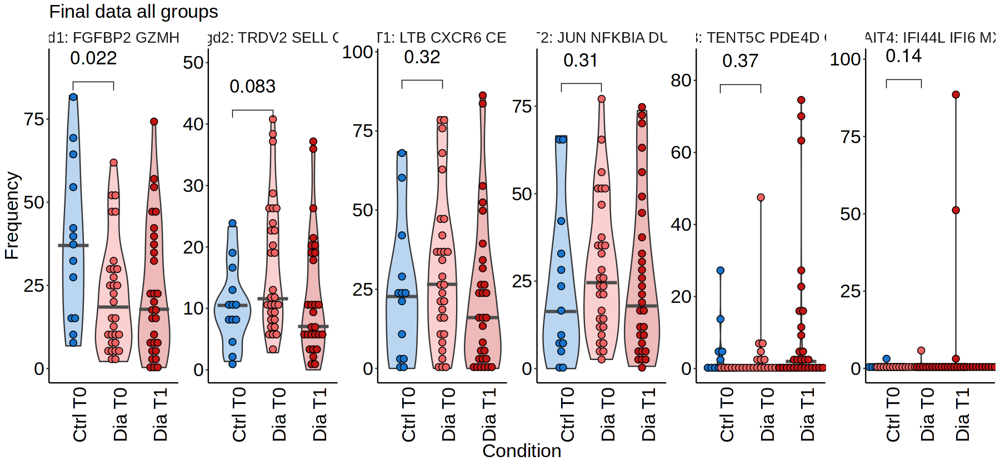

In [52]:
p5

Warning message in wilcox.test.default(c(20.1438848920863, 15.3846153846154, 23.4567901234568, :
“cannot compute exact p-value with zeroes”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 2.85714285714286, 0, :
“cannot compute exact p-value with zeroes”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, :
“cannot compute exact p-value with zeroes”
Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_point()`).”
Warning message in wilcox.test.default(c(20.1438848920863, 15.3846153846154, 23.4567901234568, :
“cannot compute exact p-value with zeroes”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 2.85714285714286, 0, :
“cannot compute exact p-value with zeroes”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, :
“cannot compute exact p-value

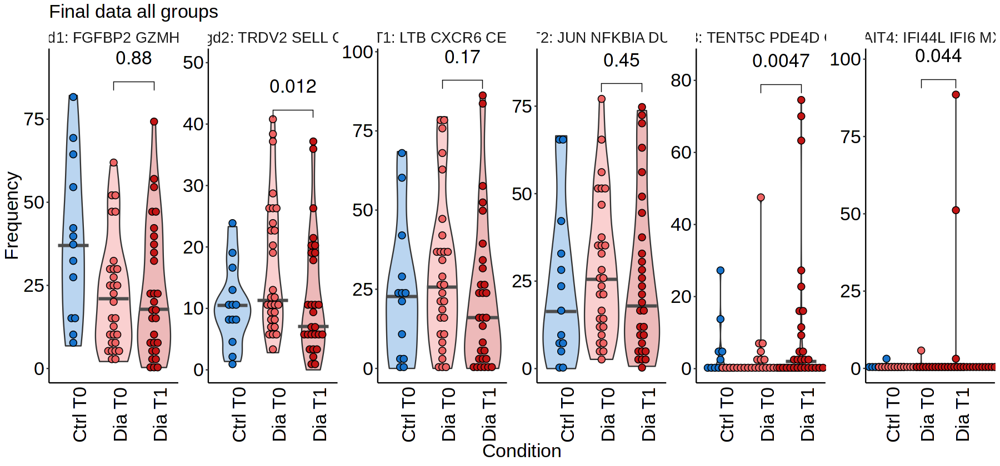

In [50]:
options(repr.plot.width = 15, repr.plot.height = 7)

p5

ggsave("../figures/subset_characterization/tgd_subsets_in_condition.svg",
       width = 30, height = 12, units = "cm")

In [48]:
  p5  <-   df4  %>% 
filter(Experiment_ID %in% c("Exp16", "Exp18", "Exp19", "Exp20"))  %>% 
dplyr::filter(Patient_ID != "116")  %>% 
  ggplot(aes(x = Condition, y = freq*100)) + # you can change the x to whatever variable you're interested in
   geom_violin(alpha = 0.3, aes(fill = Condition)) +
  stat_summary(fun = "median",
               geom = "crossbar", 
               width = 0.75,
               color = "grey30") +
   scale_fill_manual(values = c("#1874cdff",  "#ee6363ff", "#c41515ff","#eeb4b4ff")) +
scale_color_manual(values = c("dodgerblue3",  "#e54c4cff", "#aa2a2aff","#e88989ff")) +
geom_beeswarm(size = 3, cex = 3, 
              color = "black", method = "center",
             aes(fill = Condition), shape = 21) +
   facet_wrap(~annotations_manual, scales = "free", ncol = 9) +
  ylab("Frequency") +
  xlab("Condition") +
  theme_classic() +
ggtheme() +
ggpubr::stat_compare_means(label.x= 1.5, 
                           size = 7, vjust = -1, label = "p.format", comparisons = list(c(2,3)), paired = TRUE)+
ggtheme() +
 scale_y_continuous(limits = c(0,NA), expand = c(0.05,0,0,10)) +
  theme(strip.background = element_blank(), panel.grid = element_blank()) + 
  theme(axis.text = element_text(color = "black"),
        axis.text.x = element_text(angle = 90),
       axis.line = element_line(color = "black", size = 0.5),
        axis.ticks.x = element_blank()) + NoLegend() + ggtitle("Final data all groups")
ncols = length(levels(factor(df4$annotations_manual)))

Warning message in wilcox.test.default(c(20.1438848920863, 15.3846153846154, 23.4567901234568, :
“cannot compute exact p-value with zeroes”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 2.85714285714286, 0, :
“cannot compute exact p-value with zeroes”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, :
“cannot compute exact p-value with zeroes”
Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_point()`).”


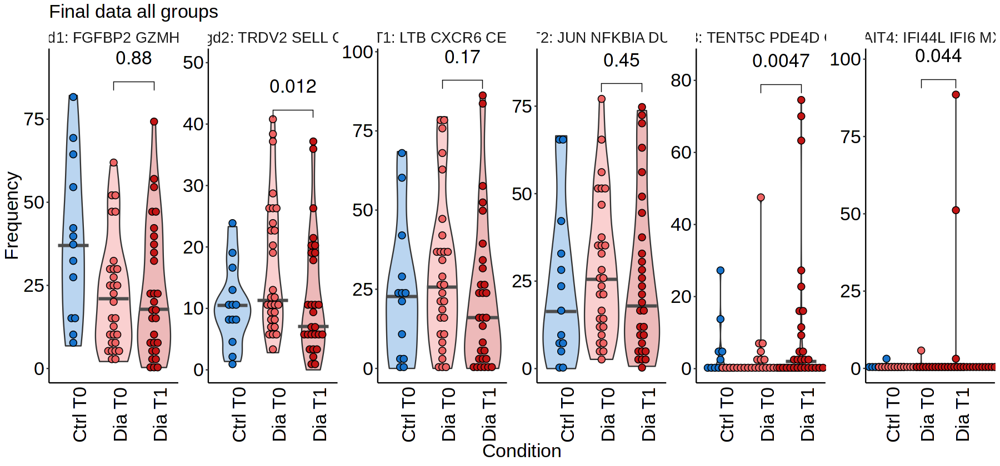

In [49]:
p5

In [10]:
scCustomize::Plot_Density_Custom(seurat_object = gd, features = "CD8A", custom_palette = c("lightblue","khaki1","red")) 

ERROR while rich displaying an object: Error in as.vector(x, "character"): cannot coerce type 'environment' to vector of type 'character'

Traceback:
1. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
2. tryCatchList(expr, classes, parentenv, handlers)
3. tryCatchOne(expr, names, parentenv, handlers[[1L]])
4. doTryCatch(return(expr), name, parentenv, handler)
5. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler)
6. repr::mime2repr[[mime]](obj)
7. repr_te

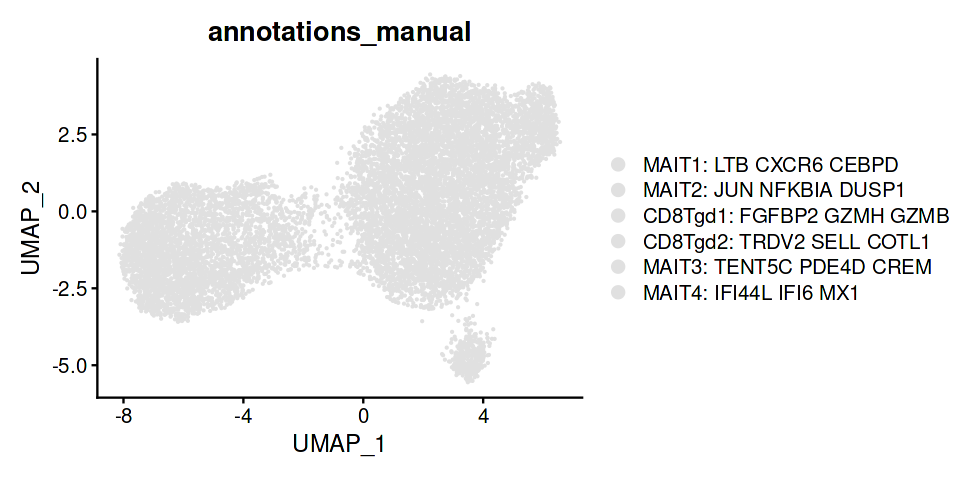

In [7]:
options(repr.plot.width = 8, repr.plot.height = 4)
DimPlot(gd, group.by = "annotations_manual", 
        cols = rep("grey88",times = 6))

In [11]:
cd8_l1_full_filt  <- readRDS("../../240218_VN_Diabetes_V05/data/processed/L1/cd8_l1_full_filt.rds")

In [ ]:
cd8_l1_full_filt@meta.data  <- left_join(cd8_l1_full_filt@meta.data, md_gd)

In [ ]:
md_gd  <- data.frame(barcode = colnames(gd), 
                     gd$annotations_manual)

In [ ]:
table(md_gd$barcode %in% colnames(cd8_l1_full_filt))

In [ ]:
cd8_l1_full_filt$gd.annotations_manual  %>% table

In [32]:
rownames(cd8_l1_full_filt@meta.data)  <- colnames(cd8_l1_full_filt)

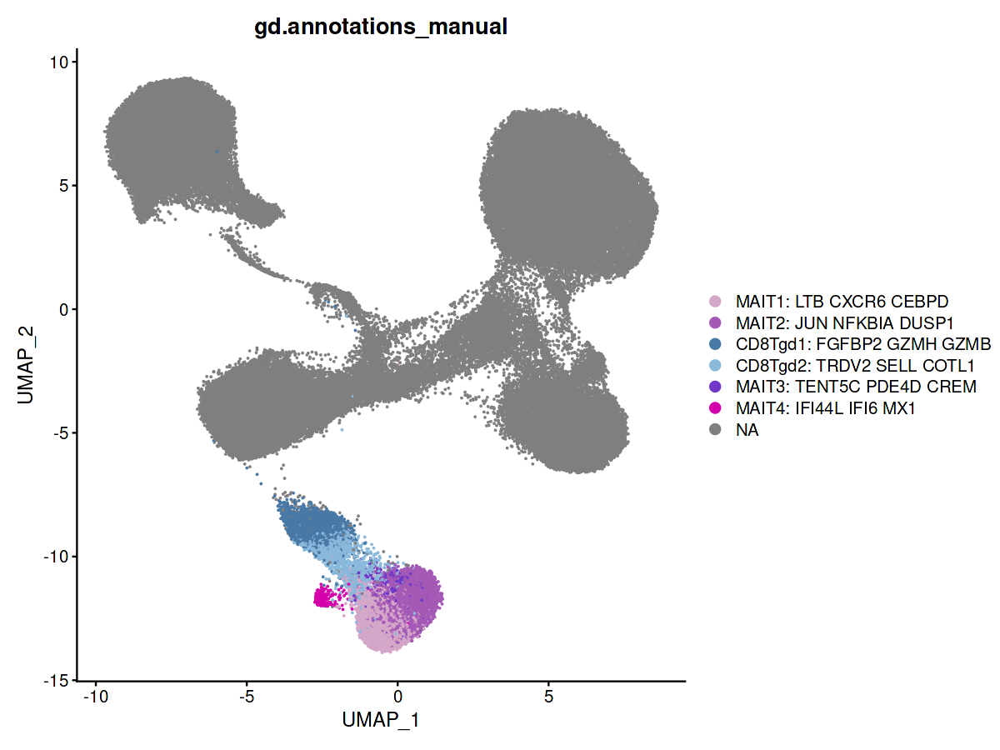

In [34]:
options(repr.plot.width = 10, repr.plot.height = 7.5)
DimPlot(cd8_l1_full_filt, group.by = "gd.annotations_manual", cols = gd@misc$cols_annotations)

Warning message:
“Found the following features in more than one assay, excluding the default. We will not include these in the final data frame: MKI67”
Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: MKI67”


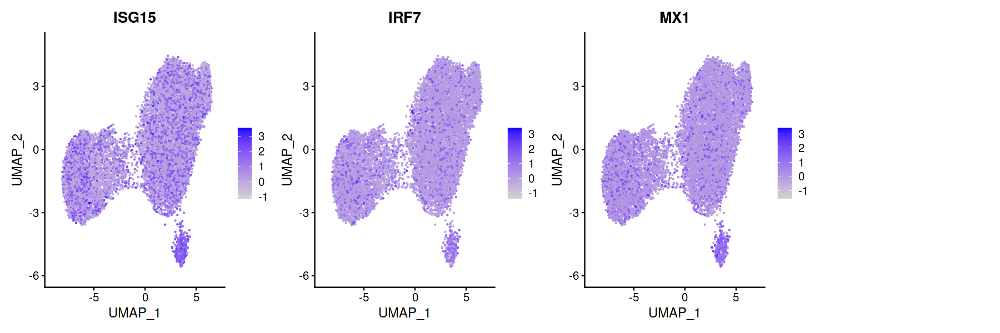

In [4]:
FeaturePlot(gd, features = c("ISG15", "IRF7","MX1","MKI67"), ncol = 4)

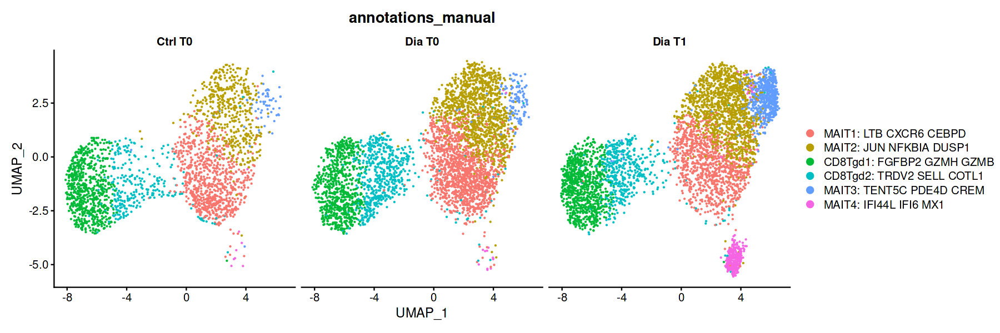

In [4]:
DimPlot(gd, group.by = "annotations_manual", split.by = "Condition")

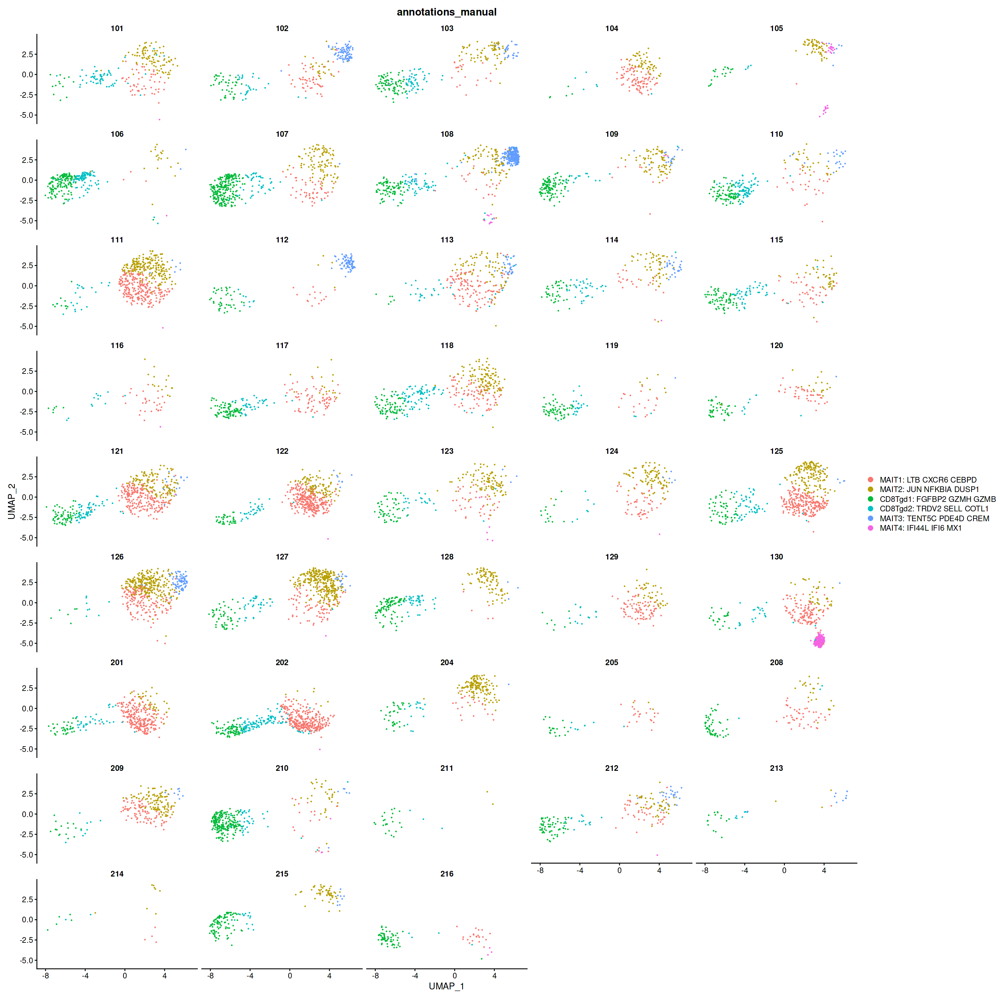

In [6]:
options(repr.plot.width = 22, repr.plot.height = 22)

DimPlot(gd, group.by = "annotations_manual", split.by = "Patient_ID", ncol = 5)

Loading required package: viridisLite



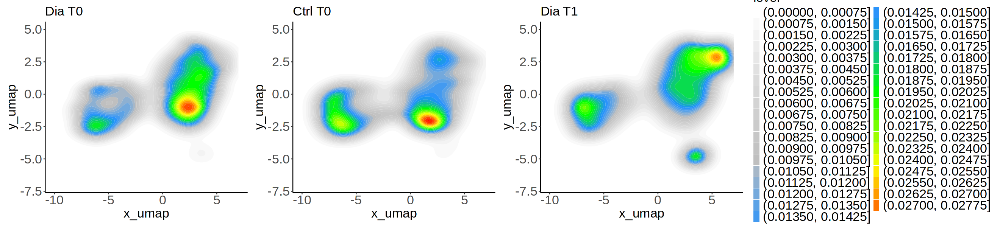

In [36]:
gd_subset  <- subset(gd, Experiment_ID %in% c("Exp16", "Exp18", "Exp19", "Exp20")) 

density  <- gd_subset@meta.data  %>% dplyr::select(Sample_ID, Condition)

density$x_umap  <- gd_subset@reductions$umap@cell.embeddings[,1]
density$y_umap  <- gd_subset@reductions$umap@cell.embeddings[,2]


library(ggplot2)
library(dplyr)
library(viridis)

colfunc <- colorRampPalette(c("white", "grey85","grey75","dodgerblue","green","yellow","red"))


options(repr.plot.width = 22, repr.plot.height = 5)

p1  <- density %>%
dplyr::filter(Condition == "Dia T0")  %>% 
  ggplot(aes(x=x_umap, y= y_umap)) + 
 geom_point(shape = "")  + geom_density_2d_filled(bins = 40)  + 
theme_classic() + ggtheme() +
xlim(-10,7)+  ylim(-7,5) +
scale_fill_manual(values = colfunc(40))  + 
ggtitle("Dia T0") + NoLegend()

p2   <-   density %>%
dplyr::filter(Condition == "Ctrl T0")  %>% 
  ggplot(aes(x=x_umap, y= y_umap)) + 
 geom_point(shape = "")  + geom_density_2d_filled(bins = 40)  + 
theme_classic() + ggtheme() +
xlim(-10,7)+  ylim(-7,5) +
scale_fill_manual(values = colfunc(40))  + 
ggtitle("Ctrl T0") + NoLegend()

p3  <-   density %>%
dplyr::filter(Condition == "Dia T1")  %>% 
  ggplot(aes(x=x_umap, y= y_umap)) + 
 geom_point(shape = "")  + geom_density_2d_filled(bins = 40)  + 
theme_classic() + ggtheme() +
xlim(-10,7)+  ylim(-7,5) +
scale_fill_manual(values = colfunc(40))  + 
ggtitle("Dia T1") 

p1 + p2 + p3

In [80]:
gd_subset  <- subset(gd, annotations_manual %in% c("CD8Tgd1: FGFBP2 GZMH GZMB","CD8Tgd2: TRDV2 SELL COTL1") &
                    )


In [83]:
density  <- gd_subset@meta.data  %>% dplyr::select(Sample_ID, Condition)

density$x_umap  <- gd_subset@reductions$umap@cell.embeddings[,1]
density$y_umap  <- gd_subset@reductions$umap@cell.embeddings[,2]

density

,Sample_ID,Condition,x_umap,y_umap
AAAGCAATCCAGATCA-1_1_1_1_1_1,154,Dia T0,-4.019714,-0.08175896
ACGGGTCGTCAGCTAT-1_1_1_1_1_1,155,Dia T0,-4.222619,-0.31671901
AGCTCTCTCAACACTG-1_1_1_1_1_1,154,Dia T0,-6.015162,-1.43624123
AGTGAGGAGTTCGATC-1_1_1_1_1_1,155,Dia T0,-1.658621,0.02446906
ATCCACCAGGCTACGA-1_1_1_1_1_1,151,Dia T0,-3.939259,-1.77908011
ATTATCCAGATCACGG-1_1_1_1_1_1,154,Dia T0,-6.164627,-2.41925378
CAAGAAATCAGTTGAC-1_1_1_1_1_1,155,Dia T0,-5.199378,-2.42748757
CACAGGCAGTTAAGTG-1_1_1_1_1_1,154,Dia T0,-2.579879,-0.90590604
CAGCCGAAGCTATGCT-1_1_1_1_1_1,151,Dia T0,-5.165478,-1.68869408
CCTTTCTAGATCGATA-1_1_1_1_1_1,151,Dia T0,-5.121498,-2.00331588


Warning message:
“Removed 2 rows containing non-finite outside the scale range
(`stat_density2d_filled()`).”
Warning message:
“Removed 2 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 5 rows containing non-finite outside the scale range
(`stat_density2d_filled()`).”
Warning message:
“Removed 5 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 1 row containing non-finite outside the scale range
(`stat_density2d_filled()`).”
Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_point()`).”


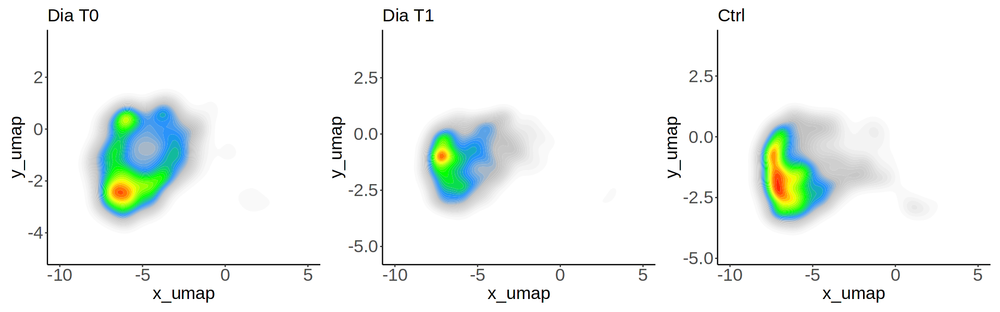

In [100]:
options(repr.plot.width = 16, repr.plot.height = 5)

p1  <- density %>%
dplyr::filter(Condition == "Dia T0")  %>% 
  ggplot(aes(x=x_umap, y= y_umap)) + 
 geom_point(shape = "")  + geom_density_2d_filled(bins = 40)  + 
theme_classic() + ggtheme() +
xlim(-10,5)+ 
#ylim(-12,6) +
scale_fill_manual(values = colfunc(40))  + 
ggtitle("Dia T0") + NoLegend()

p2   <-   density %>%
dplyr::filter(Condition == "Dia T1")  %>% 
  ggplot(aes(x=x_umap, y= y_umap)) + 
 geom_point(shape = "")  + geom_density_2d_filled(bins = 40)  + 
theme_classic() + ggtheme() +
xlim(-10,5)+  
#ylim(-12,6) +
scale_fill_manual(values = colfunc(40))  + 
ggtitle("Dia T1") + NoLegend()

p3  <-   density %>%
dplyr::filter(Condition == "Ctrl T0")  %>% 
  ggplot(aes(x=x_umap, y= y_umap)) + 
 geom_point(shape = "")  + geom_density_2d_filled(bins = 40)  + 
theme_classic() + ggtheme() +
xlim(-10,5)+  
#ylim(-12,6) +
scale_fill_manual(values = colfunc(40))  + 
ggtitle("Ctrl")  + NoLegend()

p1 + p2 + p3

In [102]:
ggsave("../figures/density_plot_gd.png", width = 30, height = 10, units = "cm")
ggsave("../figures/density_plot_gd.svg", width = 30, height = 10, units = "cm")

Warning message:
“Removed 2 rows containing non-finite outside the scale range
(`stat_density2d_filled()`).”
Warning message:
“Removed 2 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 5 rows containing non-finite outside the scale range
(`stat_density2d_filled()`).”
Warning message:
“Removed 5 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 1 row containing non-finite outside the scale range
(`stat_density2d_filled()`).”
Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 2 rows containing non-finite outside the scale range
(`stat_density2d_filled()`).”
Warning message:
“Removed 2 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 5 rows containing non-finite outside the scale range
(`stat_density2d_filled()`).”
Warning m

In [10]:
all_markers  <- read_csv("../tables/de_genes/240319_cd4_all_markers_without_sex.csv")

Rows: 10156 Columns: 10
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (5): cluster, gene, source, test_type, dataset
dbl (5): p_val, avg_log2FC, pct.1, pct.2, p_val_adj

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [11]:
all_markers

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene,source,test_type,dataset
1.281280e-22,0.2844336,0.592,0.511,1.974837e-18,Dia T0,RNASET2,scRNAseq_RNA,Dia T0 vs Ctrl T0,cd4_l3_naive
7.223966e-16,0.2972569,0.352,0.278,1.113430e-11,Dia T0,LRRN3,scRNAseq_RNA,Dia T0 vs Ctrl T0,cd4_l3_naive
2.278827e-105,0.6985571,0.661,0.489,3.512356e-101,Ctrl T0,IER2,scRNAseq_RNA,Dia T0 vs Ctrl T0,cd4_l3_naive
2.394549e-105,0.7623583,0.377,0.194,3.690719e-101,Ctrl T0,GADD45B,scRNAseq_RNA,Dia T0 vs Ctrl T0,cd4_l3_naive
1.345982e-61,0.4985708,0.177,0.074,2.074563e-57,Ctrl T0,CENPK,scRNAseq_RNA,Dia T0 vs Ctrl T0,cd4_l3_naive
1.765646e-38,0.4882509,0.241,0.143,2.721389e-34,Ctrl T0,SOCS3,scRNAseq_RNA,Dia T0 vs Ctrl T0,cd4_l3_naive
1.172715e-26,0.3134220,0.380,0.278,1.807505e-22,Ctrl T0,BTN3A2,scRNAseq_RNA,Dia T0 vs Ctrl T0,cd4_l3_naive
6.869623e-24,0.3513274,0.826,0.764,1.058815e-19,Ctrl T0,JUNB,scRNAseq_RNA,Dia T0 vs Ctrl T0,cd4_l3_naive
2.144165e-23,0.4760597,0.692,0.633,3.304802e-19,Ctrl T0,JUN,scRNAseq_RNA,Dia T0 vs Ctrl T0,cd4_l3_naive
5.162350e-18,0.4505934,0.283,0.214,7.956729e-14,Ctrl T0,PPP1R15A,scRNAseq_RNA,Dia T0 vs Ctrl T0,cd4_l3_naive


In [12]:
all_markers  %>% dplyr::filter(source == "scRNAseq_RNA" 
              & dataset == "cd4_l2_unc")    %>% 
group_by(test_type)  %>%
arrange(p_val_adj)  

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene,source,test_type,dataset
6.168392e-20,3.2234440,0.213,0.026,9.507342e-16,Ctrl T0,MTRNR2L8,scRNAseq_RNA,Dia T1 vs Ctrl T0,cd4_l2_unc
1.068311e-18,3.4912877,0.276,0.026,1.646588e-14,Keto_0 T0,MTRNR2L12,scRNAseq_RNA,Keto_1 T0 vs Keto_0 T0,cd4_l2_unc
4.335357e-17,3.4868051,0.213,0.038,6.682086e-13,Ctrl T0,MTRNR2L8,scRNAseq_RNA,Dia T0 vs Ctrl T0,cd4_l2_unc
1.974147e-16,0.7850626,0.891,0.781,3.042753e-12,Dia T0,FOS,scRNAseq_RNA,Dia T0 vs Dia T1,cd4_l2_unc
4.337874e-14,1.5954854,0.386,0.141,6.685965e-10,Ctrl T0,MTRNR2L12,scRNAseq_RNA,Dia T1 vs Ctrl T0,cd4_l2_unc
5.025172e-14,1.0309865,0.932,0.780,7.745298e-10,PR_1 T0,FOS,scRNAseq_RNA,PR_1 T0 vs PR_1 T1,cd4_l2_unc
2.074087e-13,0.4895468,0.981,0.928,3.196790e-09,PR_0 T1,ZFP36L2,scRNAseq_RNA,PR_0 T0 vs PR_0 T1,cd4_l2_unc
3.864186e-13,0.4172331,0.930,0.849,5.955870e-09,Dia T0,DUSP1,scRNAseq_RNA,Dia T0 vs Dia T1,cd4_l2_unc
3.065402e-12,0.7554488,0.912,0.724,4.724705e-08,PR_1 T0,JUN,scRNAseq_RNA,PR_1 T0 vs PR_1 T1,cd4_l2_unc
8.077446e-12,0.4484927,0.974,0.915,1.244977e-07,Keto_0 T0,ZFP36L2,scRNAseq_RNA,Keto_1 T0 vs Keto_0 T0,cd4_l2_unc


In [13]:
cd4_l2_unc_genes  <- all_markers  %>% dplyr::filter(source == "scRNAseq_RNA" 
              & dataset == "cd4_l2_unc")    %>% 
group_by(test_type)  %>%
slice_head(n = 5)  %>% 
pull(gene)


In [14]:
cd4_l2_unc_genes

[1] "MTRNR2L8"  "MTRNR2L12" "HLA-C"     "MFSD10"    "IFI44L"    "IFI44L"   
 [7] "KLF10"     "ISG15"     "EIF2AK2"   "XAF1"      "EEF1G"     "ZFP36L2"  
[13] "PTPRCAP"   "LDHB"      "ARL4C"     "MTRNR2L12" "ZFP36L2"   "PCBP1"    
[19] "IL7R"      "LEPROTL1"  "ZFP36L2"   "SARAF"     "JUNB"      "TXNIP"    
[25] "KLF10"     "CISH"      "SAMHD1"    "LTB"       "LFNG"      "SLC40A1"  
[31] "JUNB"      "SOCS3"     "PLGRKT"    "PCBP1"     "GPSM3"     "ISG15"    
[37] "IFI44L"    "IFIT3"     "EIF2AK2"   "IFI6"

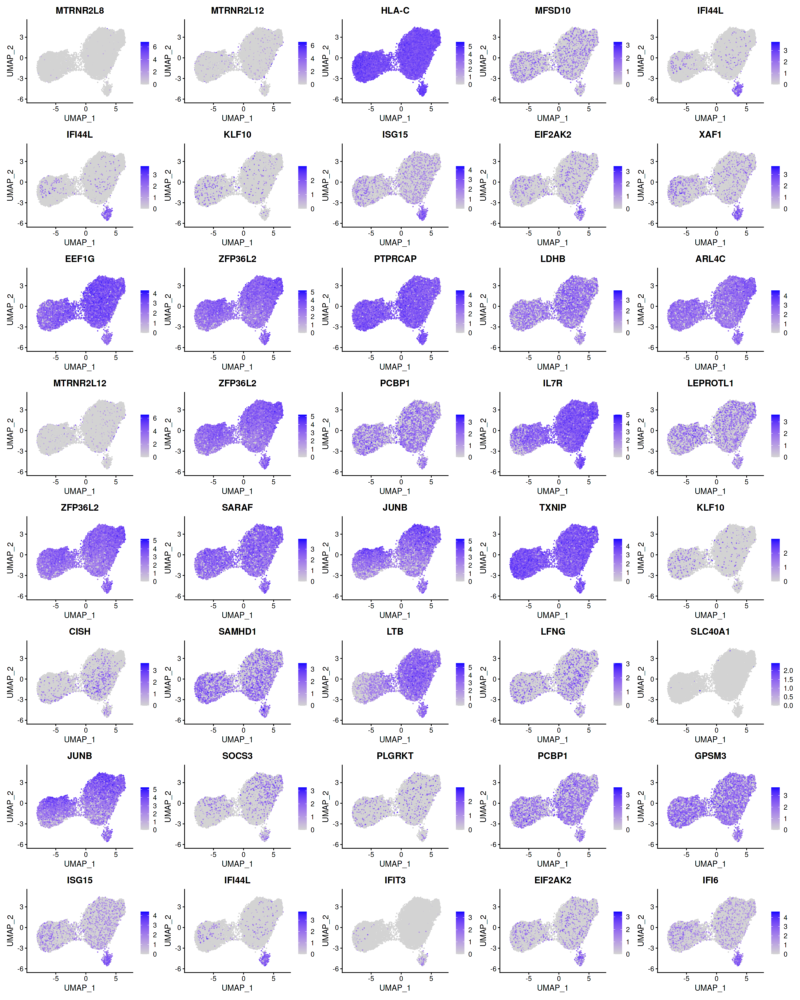

In [15]:
options(repr.plot.width = 20, repr.plot.height = 25)
DefaultAssay(gd)  <- "RNA"
FeaturePlot(gd, features = cd4_l2_unc_genes, ncol = 5, min.cutoff = 0)

In [53]:
md2  <- get_gene_pct_expression(gd, c("GZMB","CTLA4"))

Warning message:
“There was 1 warning in `mutate()`.
ℹ In argument: `across(.fns = fns_replace)`.
Caused by warning:
! Using `across()` without supplying `.cols` was deprecated in dplyr 1.1.0.
ℹ Please supply `.cols` instead.”


Bin width defaults to 1/30 of the range of the data. Pick better value with
`binwidth`.
Warning message:
“Removed 12 rows containing missing values or values outside the scale range
(`geom_point()`).”


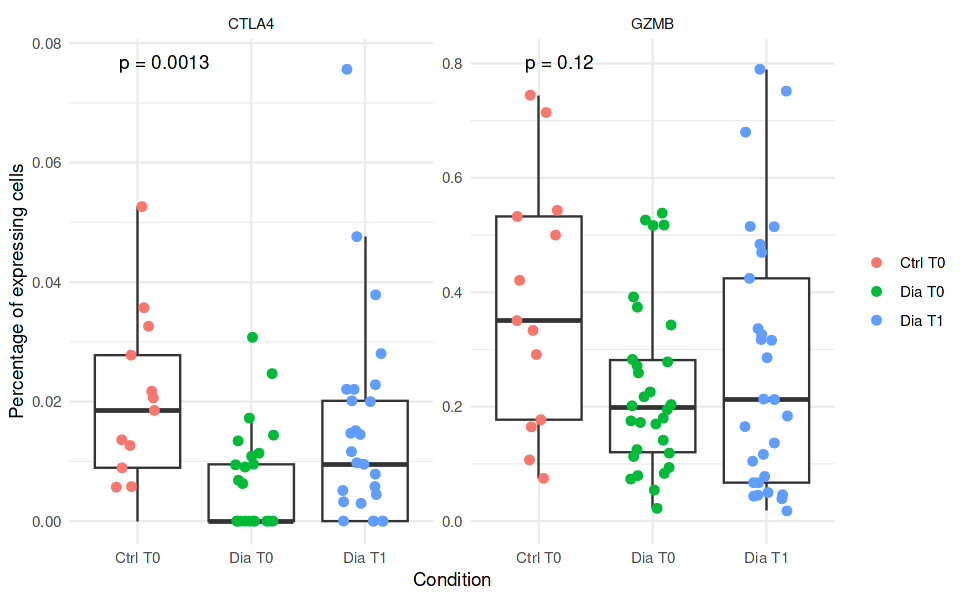

In [54]:
options(repr.plot.width = 8, repr.plot.height = 5)
# Plot the results
md2 %>% 
dplyr::filter(Condition %in% c("Ctrl T0", "Dia T0", "Dia T1") & 
              Experiment_ID %in% c("Exp16", "Exp18", "Exp19", "Exp20"))  %>% 
ggplot(aes(x = Condition, y = as.numeric(pct_express))) + 
  geom_boxplot(outlier.shape = NA) +
  geom_dotplot(binaxis='y', stackdir='center', dotsize=0) + 
  geom_jitter(position=position_jitter(0.2), size = 2, aes(color = factor(Condition))) +
  theme_minimal() + 
  facet_wrap(~gene, scales = "free", ncol = 5) + 
  ylim(c(0,NA)) +
  ylab("Percentage of expressing cells") +
  theme(legend.title = element_blank()) + stat_compare_means(label = "p.format")

In [19]:
gd_t0  <- subset(gd, 
                            Condition %in% c("Ctrl T0", "Dia T0") & 
                            Experiment_ID_2 %in% c("Exp16", "Exp18", "Exp19", "Exp20"))
gd_t0$Condition_ID  <- paste(gd_t0$Condition, gd_t0$Sample_ID)

In [20]:
avgexp = AggregateExpression(gd_t0, 
                                       features = rownames(gd_t0),
                           return.seurat = T, group.by = "Condition_ID", 
                          assay = "RNA")



Centering and scaling data matrix



In [21]:
colnames(avgexp)

[1] "Ctrl T0 287" "Ctrl T0 307" "Ctrl T0 316" "Ctrl T0 331" "Ctrl T0 340"
 [6] "Ctrl T0 351" "Ctrl T0 360" "Ctrl T0 382" "Ctrl T0 402" "Ctrl T0 428"
[11] "Ctrl T0 444" "Ctrl T0 445" "Ctrl T0 446" "Dia T0 288"  "Dia T0 290" 
[16] "Dia T0 292"  "Dia T0 294"  "Dia T0 308"  "Dia T0 310"  "Dia T0 312" 
[21] "Dia T0 314"  "Dia T0 332"  "Dia T0 334"  "Dia T0 336"  "Dia T0 338" 
[26] "Dia T0 352"  "Dia T0 354"  "Dia T0 356"  "Dia T0 358"  "Dia T0 374" 
[31] "Dia T0 376"  "Dia T0 378"  "Dia T0 380"  "Dia T0 394"  "Dia T0 396" 
[36] "Dia T0 397"  "Dia T0 399"  "Dia T0 420"  "Dia T0 422"  "Dia T0 424" 
[41] "Dia T0 426"  "Dia T0 440"  "Dia T0 442"

In [22]:
avgexp$sample  <- colnames(avgexp)

In [23]:
avgexp@meta.data  <- avgexp@meta.data  %>% separate(sample, 
                                                    into = c("Condition", "Time","Sample_ID"), 
                                                    remove = F,
                                                    sep = " ")

In [24]:
Idents(avgexp)  <- avgexp$Condition

In [25]:
mrk  <- FindAllMarkers(avgexp, only.pos = T)

Calculating cluster Ctrl

Calculating cluster Dia



In [26]:
mrk

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
CTLA4,0.0001426842,0.8479466,0.923,0.400,1,Ctrl,CTLA4
RHBDL1,0.0007438189,0.7181567,0.462,0.033,1,Ctrl,RHBDL1
PCDH1,0.0009814130,0.7868615,0.769,0.367,1,Ctrl,PCDH1
TIGD3,0.0009996302,0.7045702,0.462,0.033,1,Ctrl,TIGD3
SGCE,0.0017146272,0.7869521,0.462,0.067,1,Ctrl,SGCE
SLC43A2,0.0017440049,0.7720263,0.692,0.267,1,Ctrl,SLC43A2
SH3PXD2B,0.0017963729,0.5870983,0.308,0.000,1,Ctrl,SH3PXD2B
MYLPF,0.0018023071,0.6259215,0.846,0.567,1,Ctrl,MYLPF
RAMP1,0.0018350678,0.7308312,0.769,0.233,1,Ctrl,RAMP1
PALM2AKAP2,0.0022384428,0.4112635,0.923,0.867,1,Ctrl,PALM2AKAP2


In [27]:
md3  <- get_gene_pct_expression(gd, mrk$gene)

Bin width defaults to 1/30 of the range of the data. Pick better value with
`binwidth`.
Warning message:
“Removed 734 rows containing missing values (`geom_point()`).”


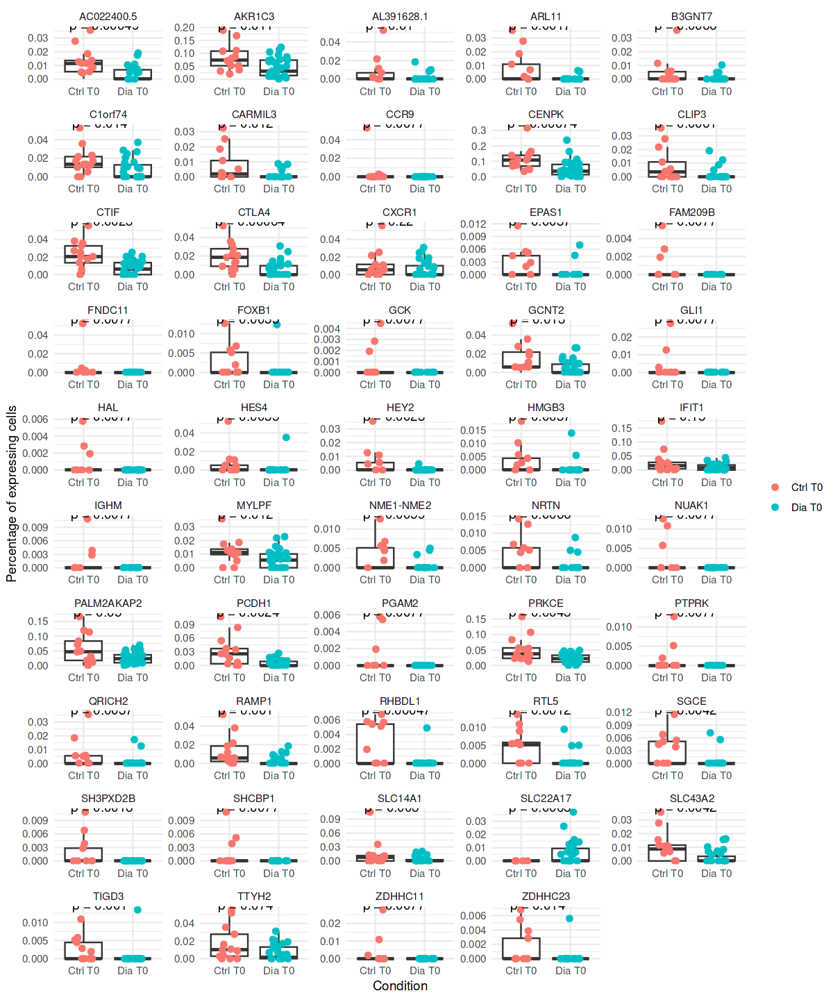

In [28]:
options(repr.plot.width = 10, repr.plot.height = 12)
# Plot the results
md3 %>% 
dplyr::filter(Condition %in% c("Ctrl T0", "Dia T0") & 
              Experiment_ID %in% c("Exp16", "Exp18", "Exp19", "Exp20"))  %>% 
ggplot(aes(x = Condition, y = as.numeric(pct_express))) + 
  geom_boxplot(outlier.shape = NA) +
  geom_dotplot(binaxis='y', stackdir='center', dotsize=0) + 
  geom_jitter(position=position_jitter(0.2), size = 2, aes(color = factor(Condition))) +
  theme_minimal() + 
  facet_wrap(~gene, scales = "free", ncol = 5) + 
  ylim(c(0,NA)) +
  ylab("Percentage of expressing cells") +
  theme(legend.title = element_blank()) + stat_compare_means(label = "p.format")

Bin width defaults to 1/30 of the range of the data. Pick better value with
`binwidth`.
Warning message:
“Removed 1168 rows containing missing values (`geom_point()`).”


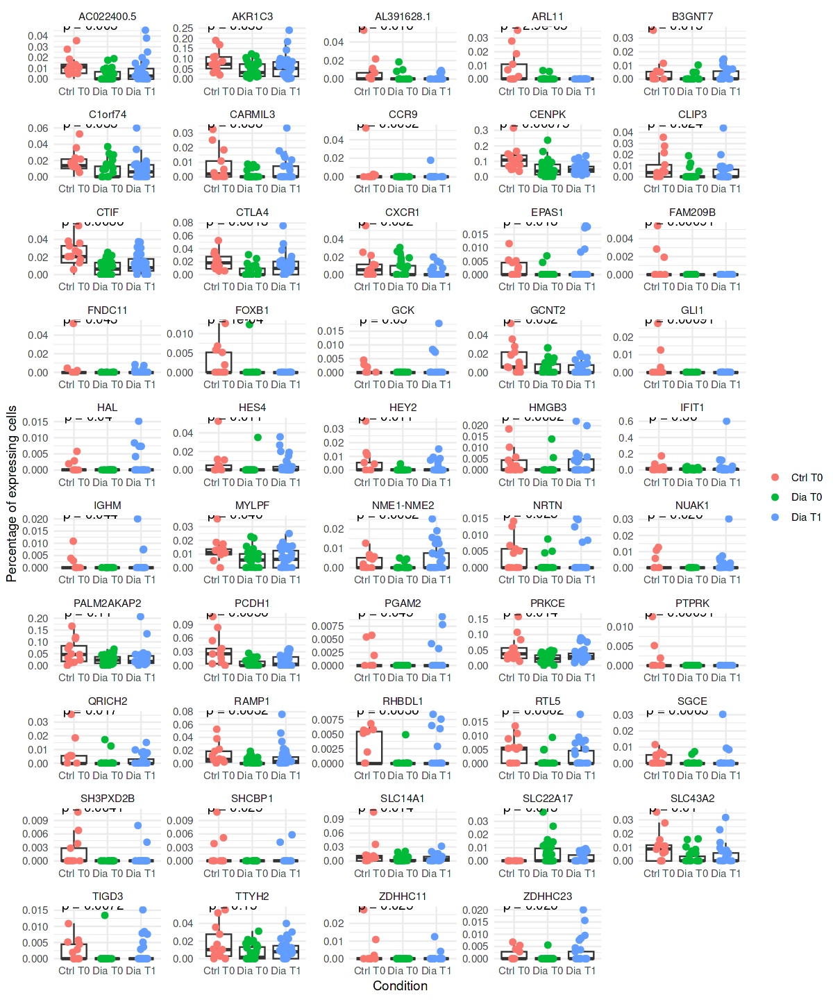

In [29]:
options(repr.plot.width = 10, repr.plot.height = 12)
# Plot the results
md3 %>% 
dplyr::filter(Condition %in% c("Ctrl T0", "Dia T0", "Dia T1") & 
              Experiment_ID %in% c("Exp16", "Exp18", "Exp19", "Exp20"))  %>% 
ggplot(aes(x = Condition, y = as.numeric(pct_express))) + 
  geom_boxplot(outlier.shape = NA) +
  geom_dotplot(binaxis='y', stackdir='center', dotsize=0) + 
  geom_jitter(position=position_jitter(0.2), size = 2, aes(color = factor(Condition))) +
  theme_minimal() + 
  facet_wrap(~gene, scales = "free", ncol = 5) + 
  ylim(c(0,NA)) +
  ylab("Percentage of expressing cells") +
  theme(legend.title = element_blank()) + stat_compare_means(label = "p.format")


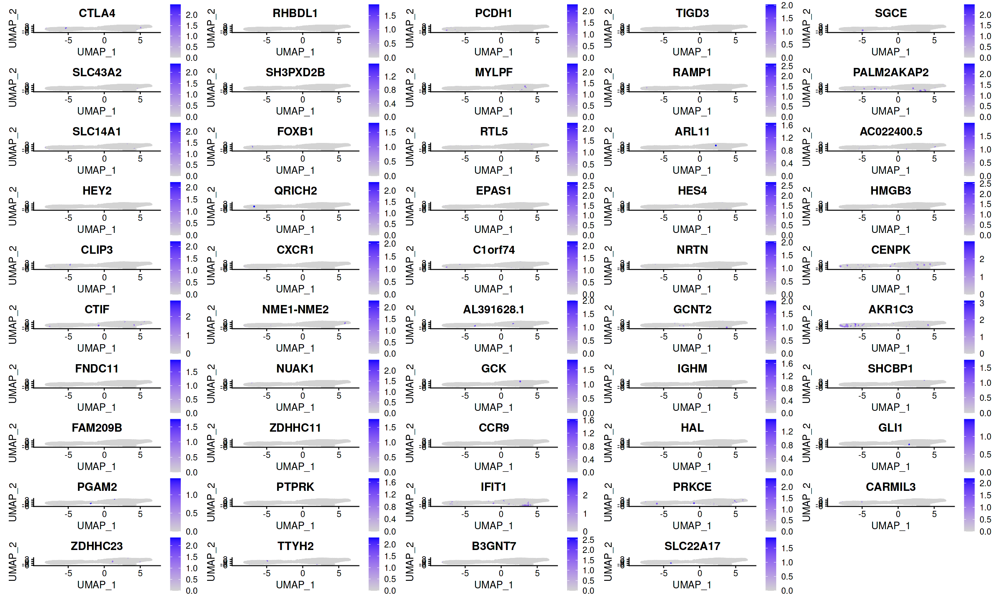

In [30]:
options(repr.plot.width = 20, repr.plot.height = 12)
DefaultAssay(gd)  <- "RNA"
FeaturePlot(gd, features = mrk$gene, ncol = 5, min.cutoff = 0)

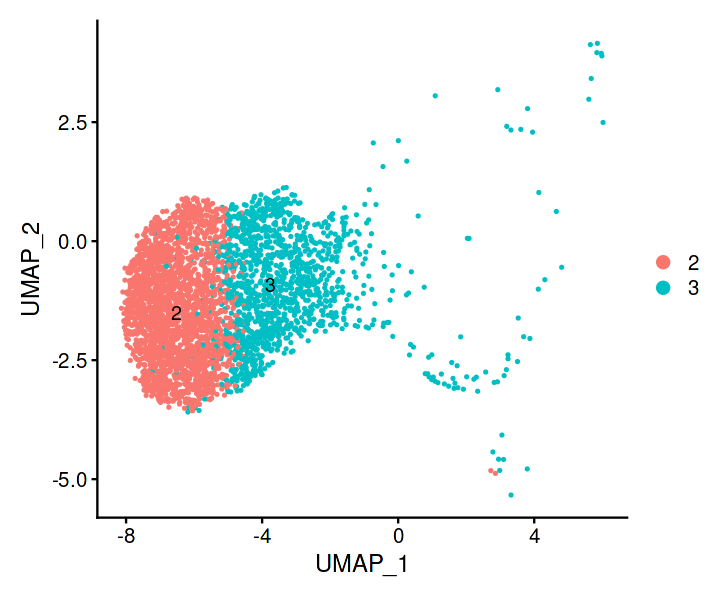

In [44]:
options(repr.plot.width = 6, repr.plot.height = 5)
DimPlot(gd, label = T)

In [5]:
gd  <- subset(gd, seurat_clusters %in% c(2,3))

In [104]:
DefaultAssay(gd)  <- "RNA"

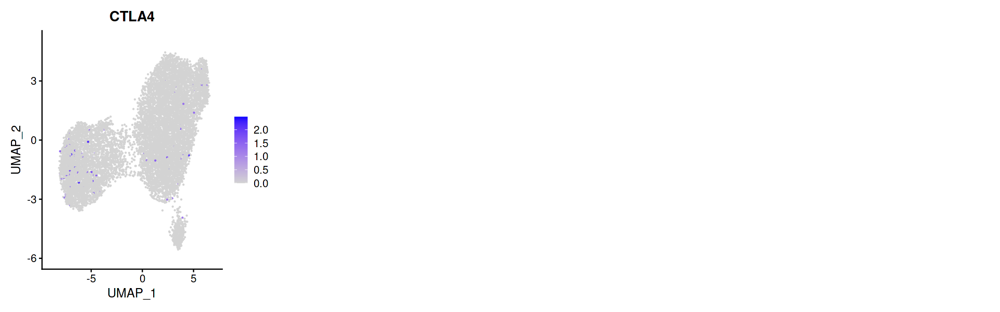

In [109]:
FeaturePlot(gd, features = "CTLA4", ncol = 5, min.cutoff = 0)

In [111]:
scCustomize::Plot_Density_Custom(gd, features = "CTLA4", custom_palette = c("lightblue","khaki1","red"))

ERROR while rich displaying an object: Error in as.vector(x, "character"): cannot coerce type 'environment' to vector of type 'character'

Traceback:
1. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
2. tryCatchList(expr, classes, parentenv, handlers)
3. tryCatchOne(expr, names, parentenv, handlers[[1L]])
4. doTryCatch(return(expr), name, parentenv, handler)
5. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler)
6. repr::mime2repr[[mime]](obj)
7. repr_te

Warning message in FeaturePlot(gd, features = "IL19", ncol = 5, min.cutoff = 0):
“All cells have the same value (0) of IL19.”


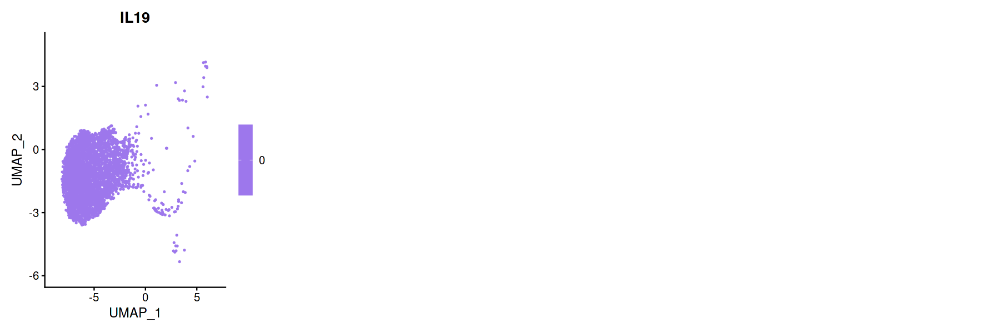

In [10]:
FeaturePlot(gd, features = "IL19", ncol = 5, min.cutoff = 4)

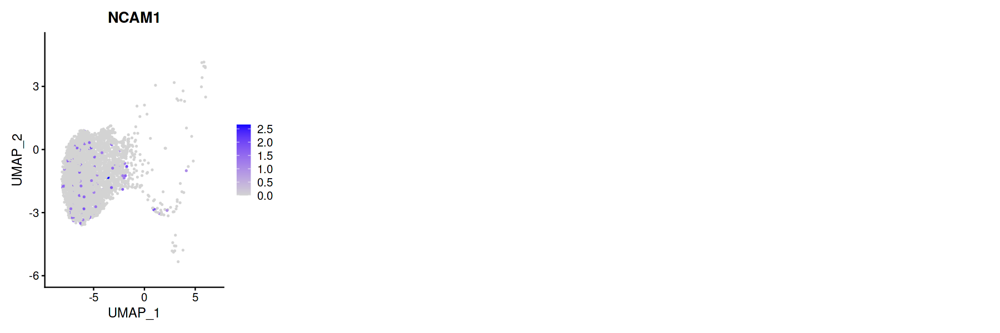

In [15]:
FeaturePlot(gd, features = "NCAM1", min.cutoff = 0, ncol = 4)

In [ ]:
FeaturePlot(gd, features = "GZMK", min.cutoff = 0, ncol = 4)

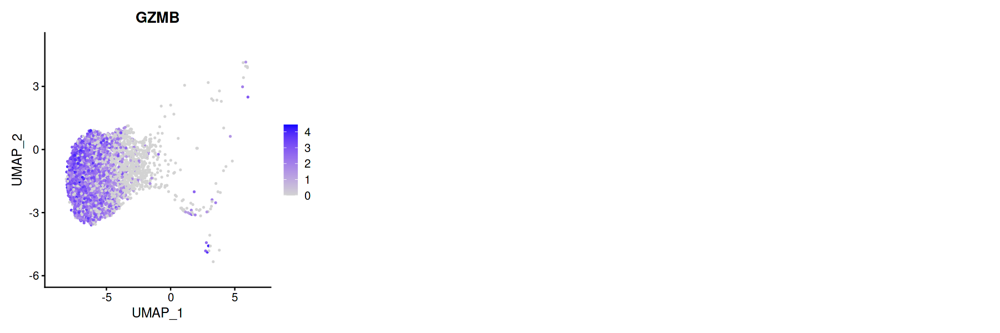

In [17]:
FeaturePlot(gd, features = "GZMB", min.cutoff = 0, ncol = 4)

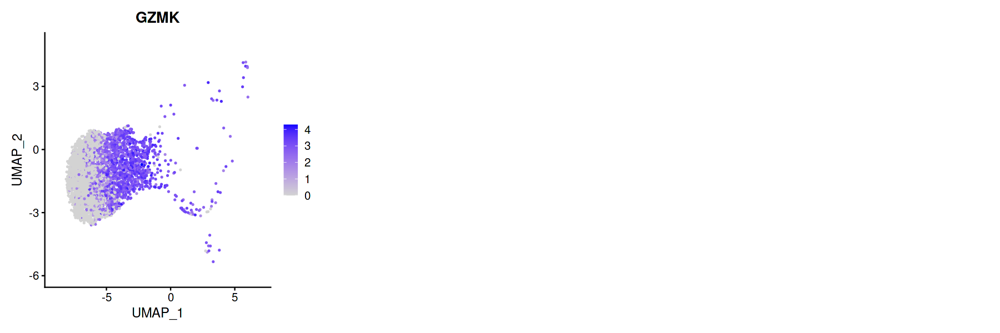

In [18]:
FeaturePlot(gd, features = "GZMK", min.cutoff = 0, ncol = 4)

Warning message in FeaturePlot(gd, features = "FOXP3", min.cutoff = 0):
“All cells have the same value (0) of FOXP3.”


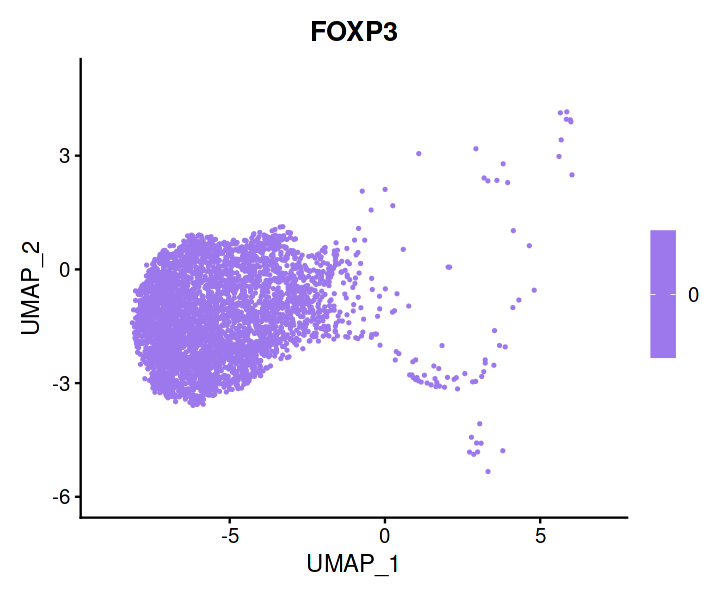

In [68]:
FeaturePlot(gd, features = "", min.cutoff = 0)

In [48]:
FeaturePlot(gd, features = "IL13A", min.cutoff = 0)

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: IL13A”


ERROR: Error: None of the requested features were found: IL13A in slot data


In [55]:
genes  <- grep(rownames(gd@assays$RNA@counts), pattern = "^IL", value = T)

In [56]:
genes

[1] "IL23R"   "IL12RB2" "ILF2"    "IL6R"    "IL24"    "IL1R1"   "IL18R1" 
 [8] "IL18RAP" "IL1B"    "IL36A"   "IL1RN"   "ILKAP"   "IL5RA"   "IL17RE" 
[15] "IL17RC"  "IL20RB"  "IL12A"   "IL1RAP"  "IL15"    "IL7R"    "IL6ST"  
[22] "IL5"     "ILRUN"   "IL3RA"   "IL2RG"   "IL13RA1" "IL7"     "IL11RA" 
[29] "ILK"     "IL18BP"  "IL18"    "IL10RA"  "IL15RA"  "IL2RA"   "IL23A"  
[36] "IL16"    "IL32"    "IL4R"    "IL21R"   "ILF3"    "IL27RA"  "ILVBL"  
[43] "IL12RB1" "IL4I1"   "IL17RA"  "IL2RB"   "IL10RB"  "IL17RB"  "IL2"    
[50] "IL9R"    "ILDR2"   "IL1RL1"  "IL17D"   "IL17C"   "IL10"    "IL19"   
[57] "IL36G"   "IL4"     "IL26"    "IL22RA1" "IL17RD"  "IL27"    "IL11"

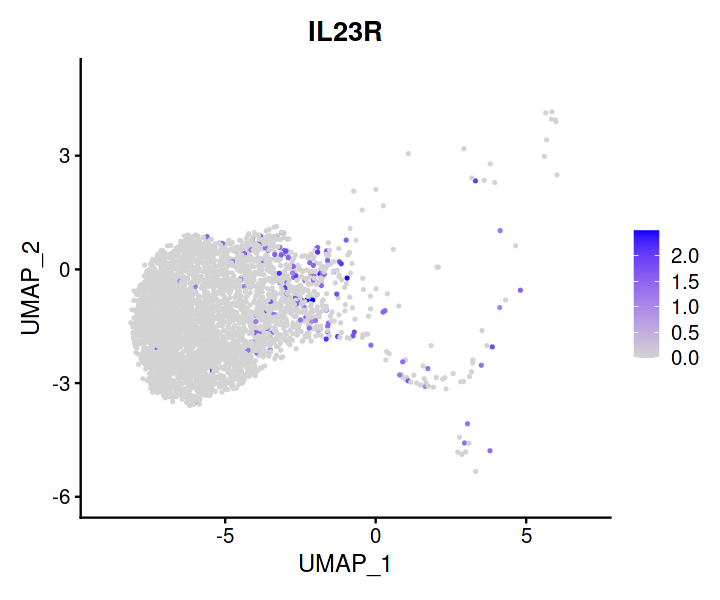

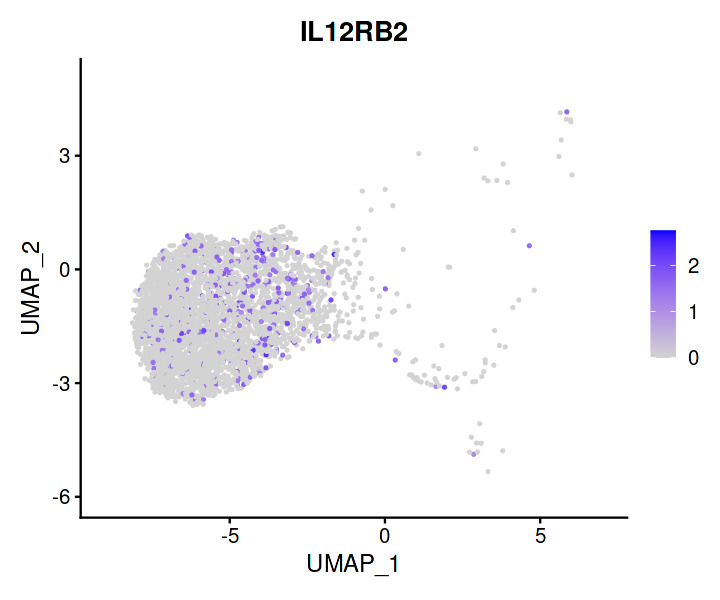

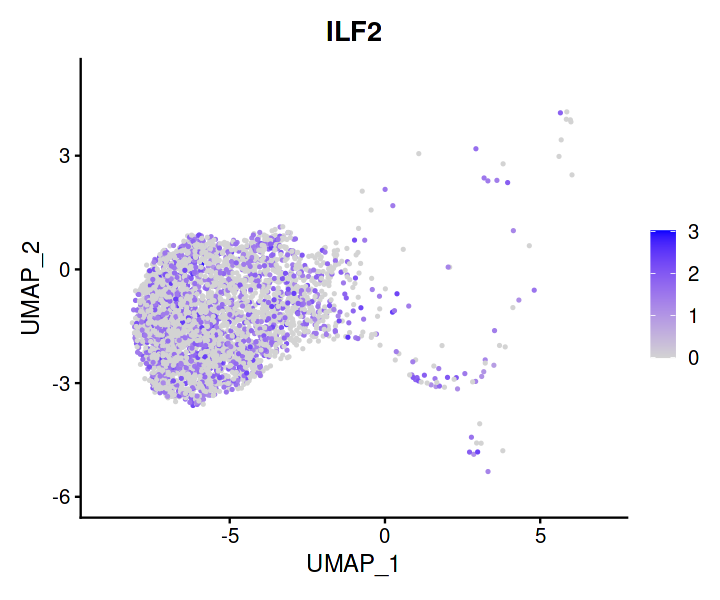

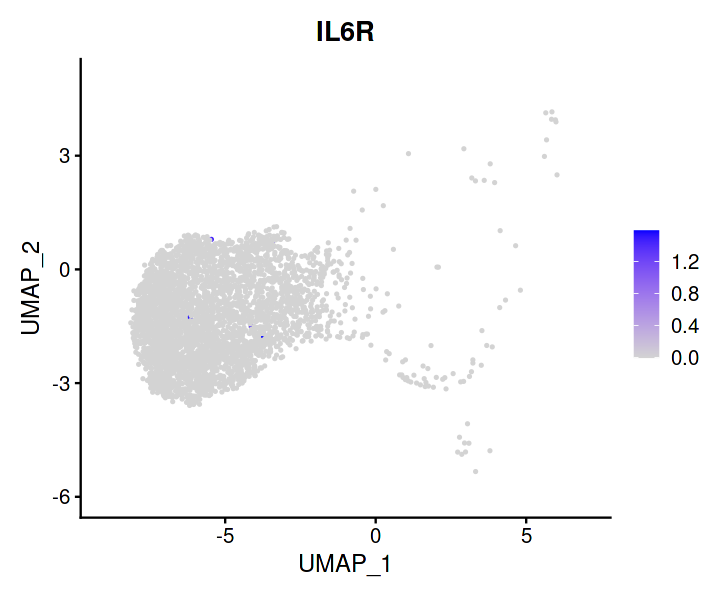

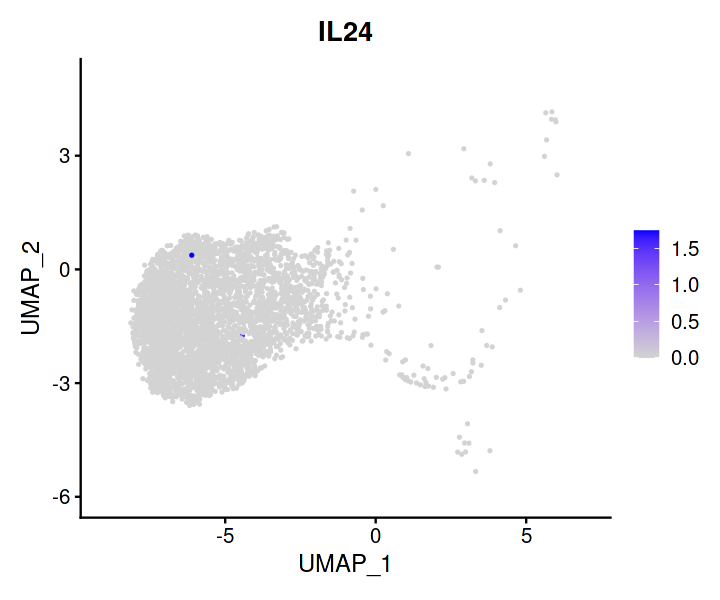

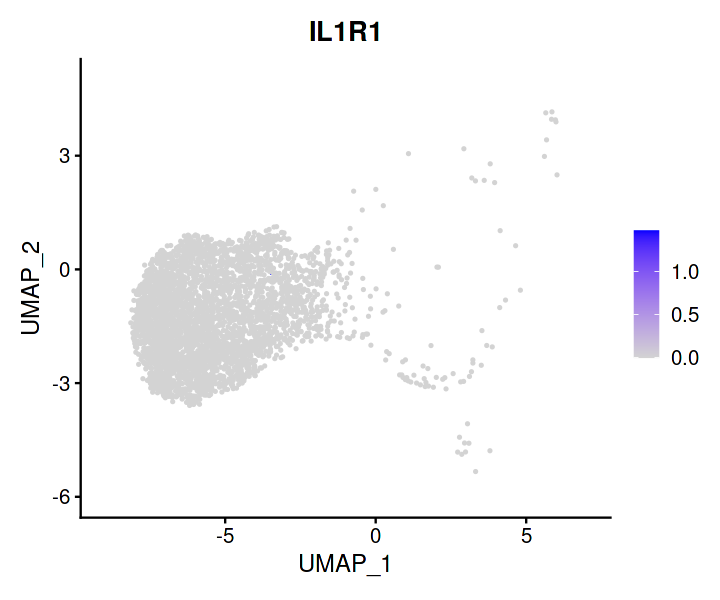

Warning message in FeaturePlot(gd, features = i, min.cutoff = 0):
“All cells have the same value (0) of IL1B.”


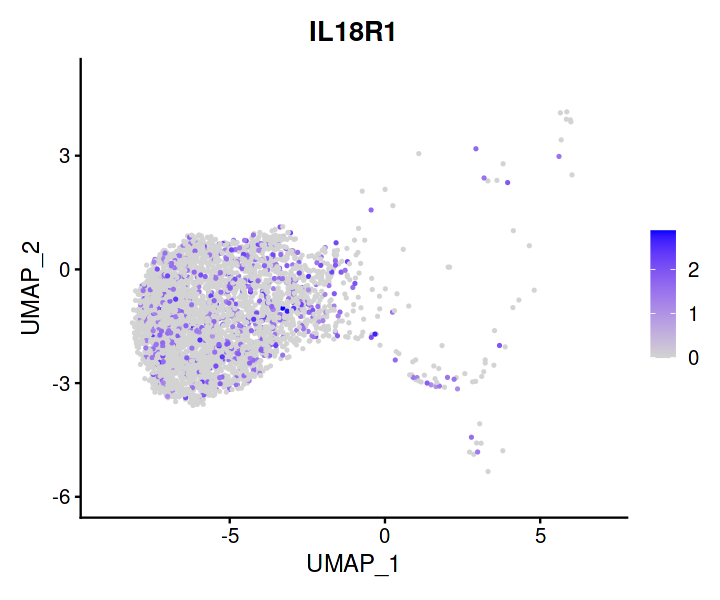

Warning message in FeaturePlot(gd, features = i, min.cutoff = 0):
“All cells have the same value (0) of IL36A.”


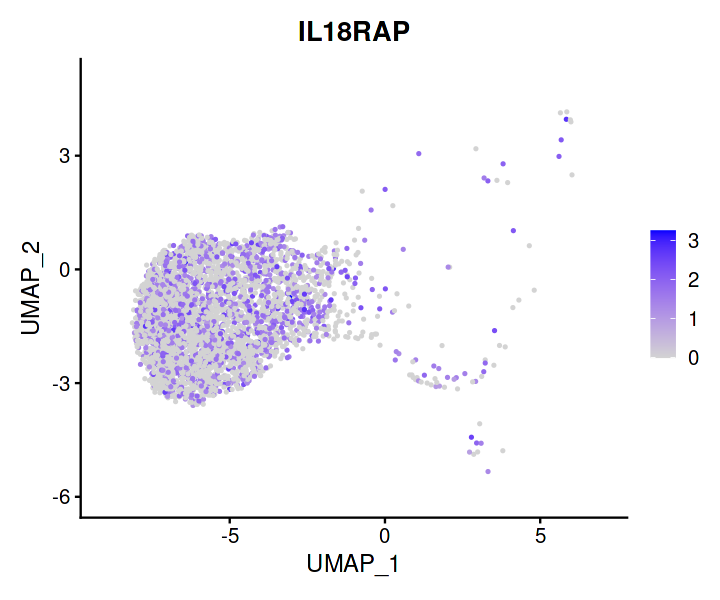

Warning message in FeaturePlot(gd, features = i, min.cutoff = 0):
“All cells have the same value (0) of IL1RN.”


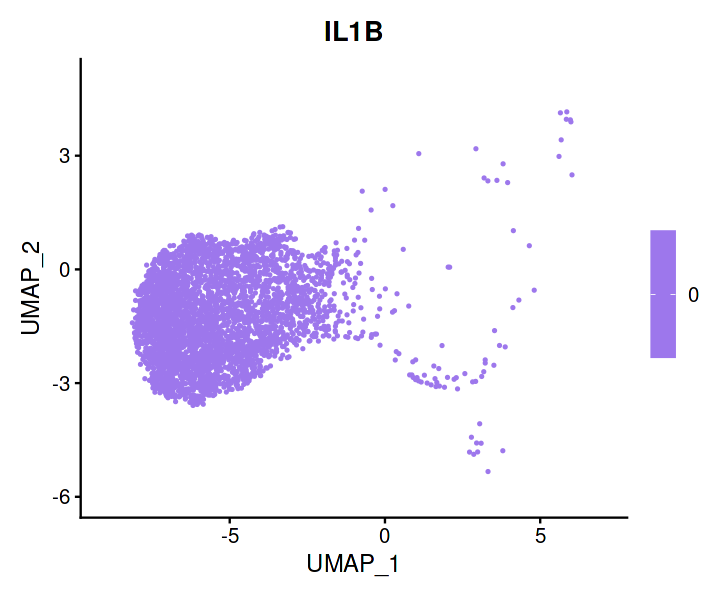

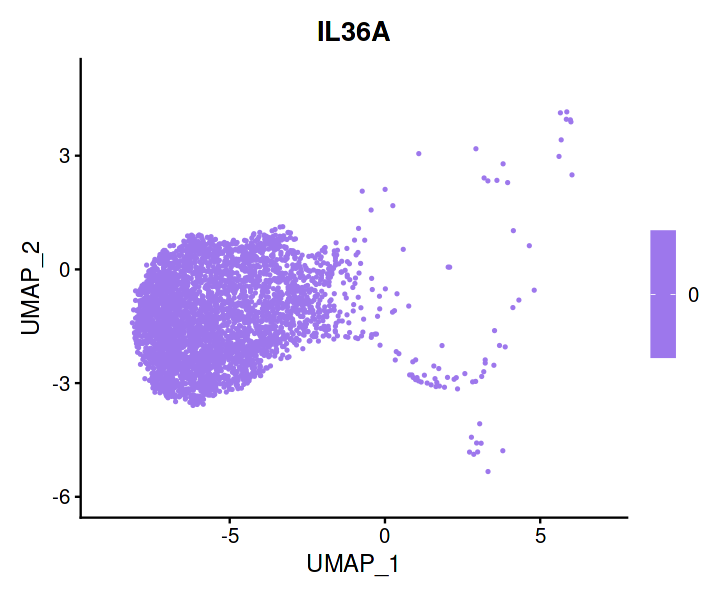

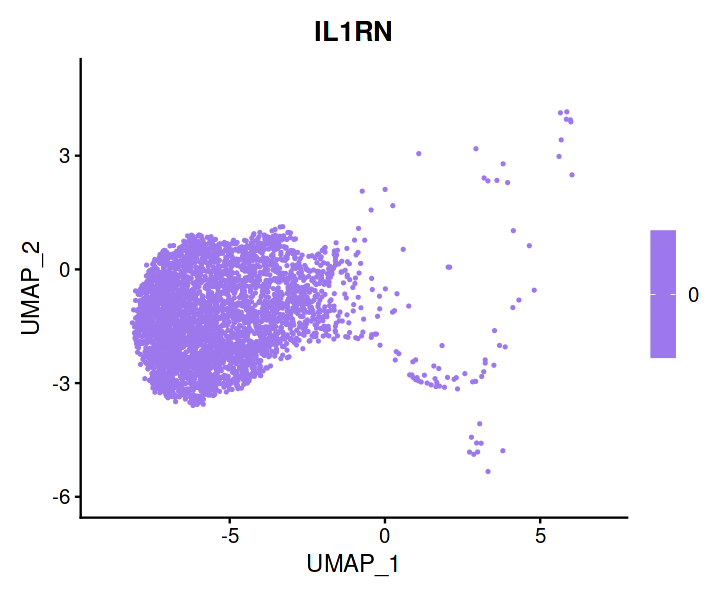

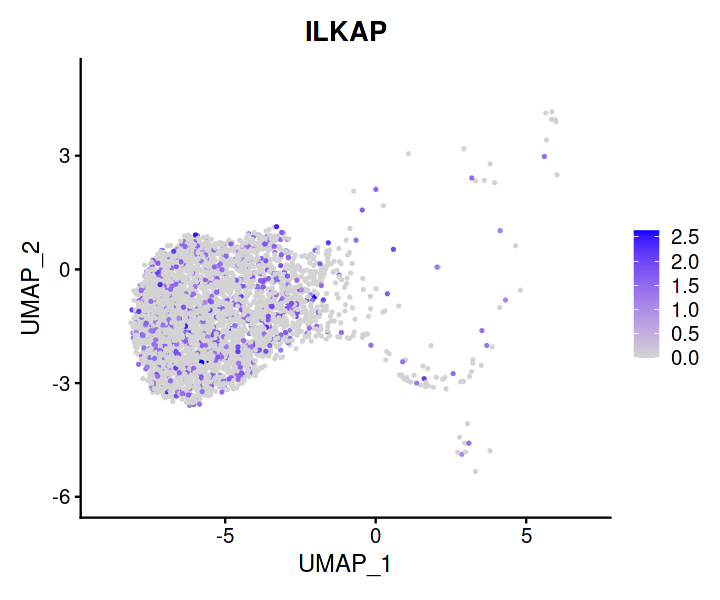

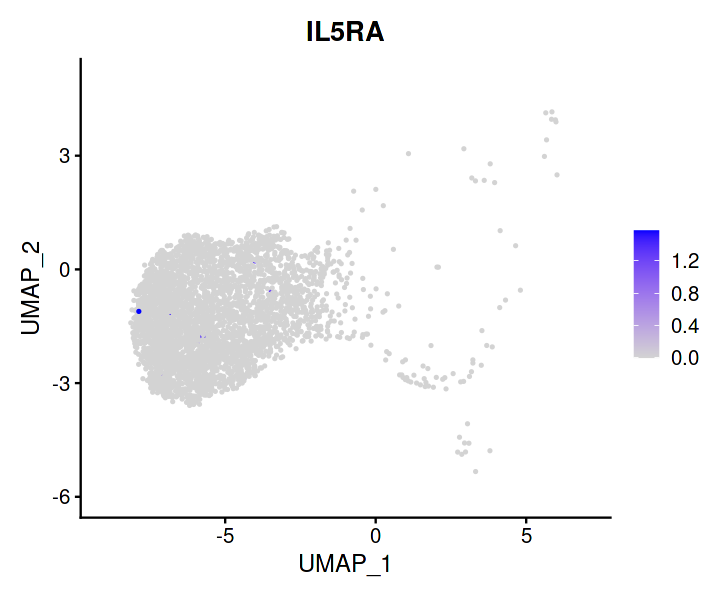

...

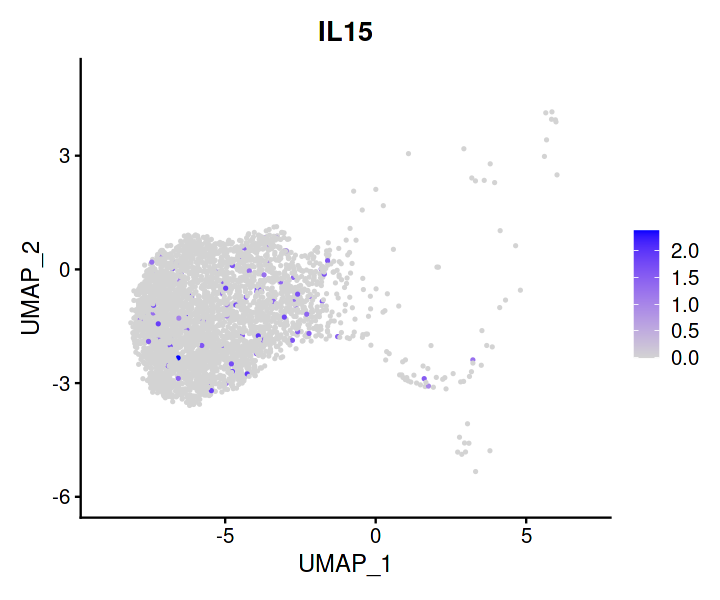

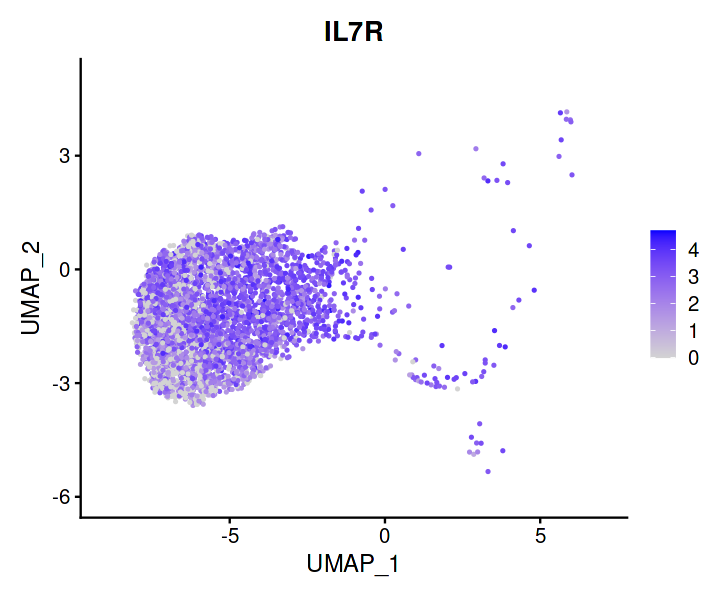

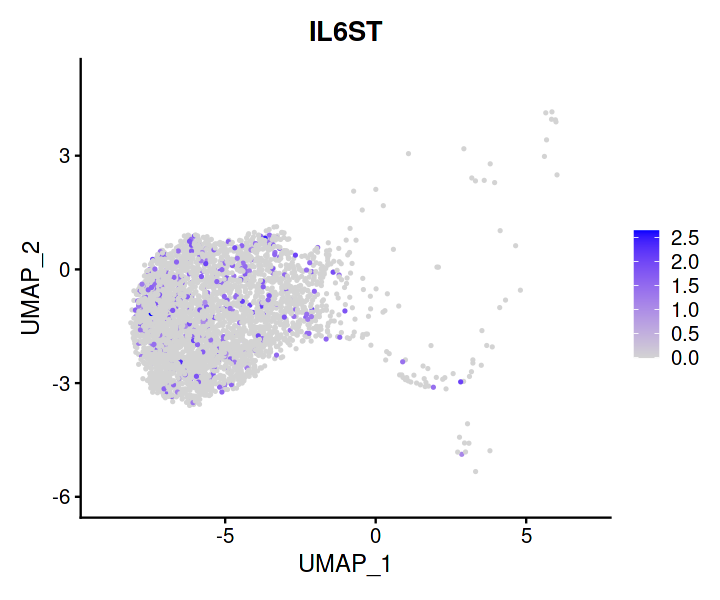

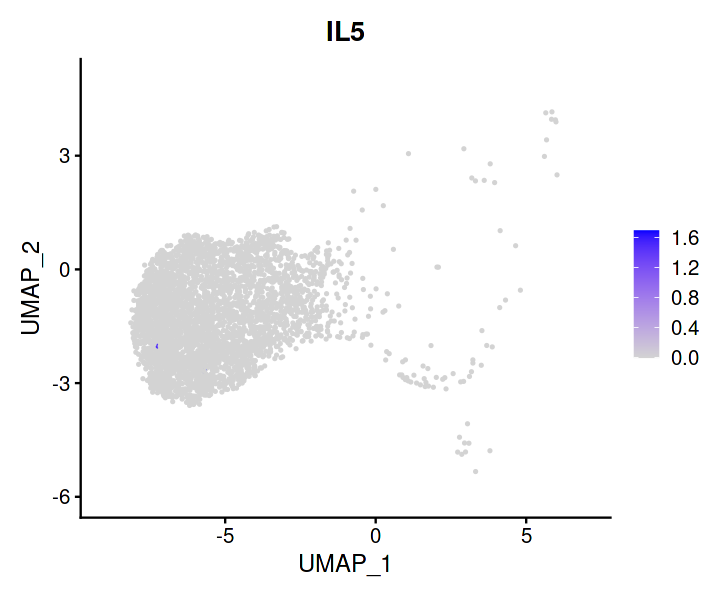

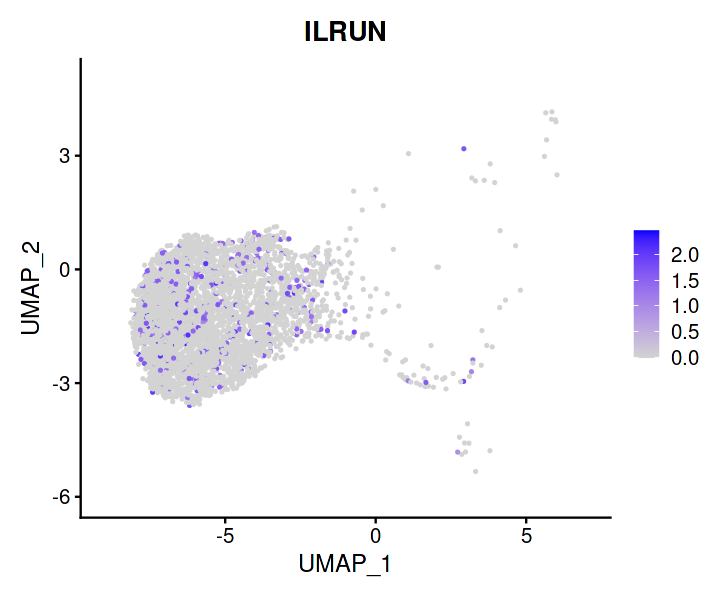

Warning message in FeaturePlot(gd, features = i, min.cutoff = 0):
“All cells have the same value (0) of IL13RA1.”


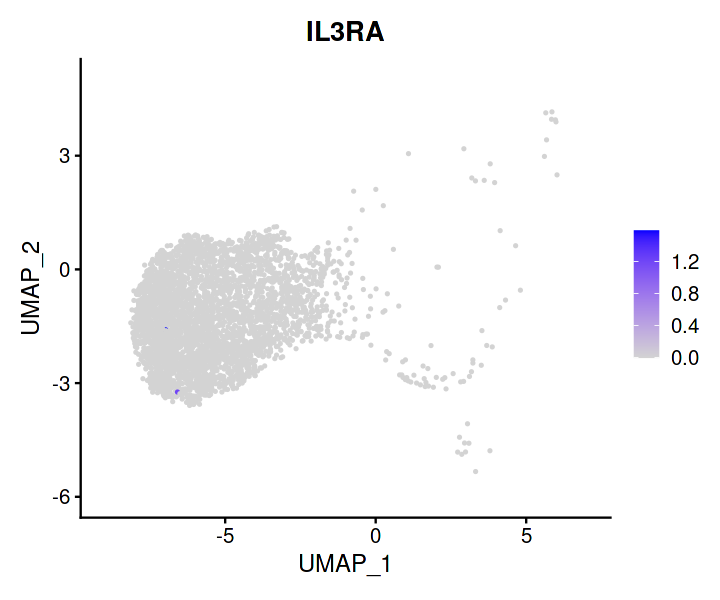

Warning message in FeaturePlot(gd, features = i, min.cutoff = 0):
“All cells have the same value (0) of IL7.”


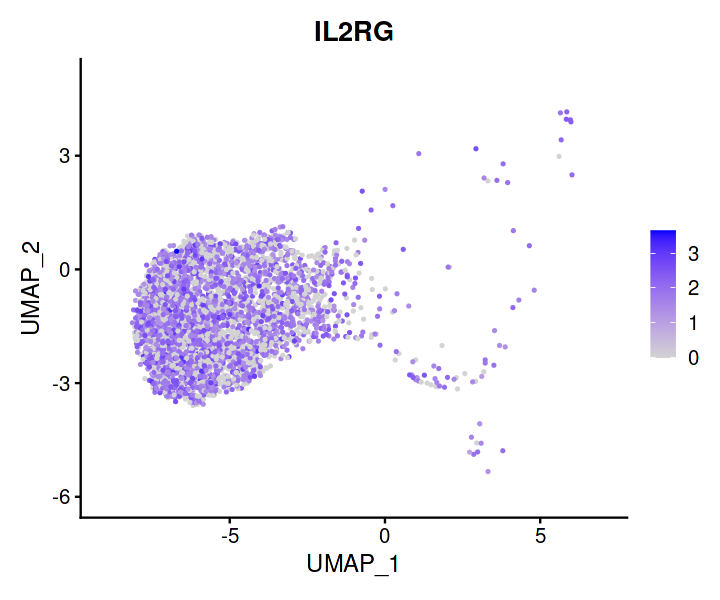

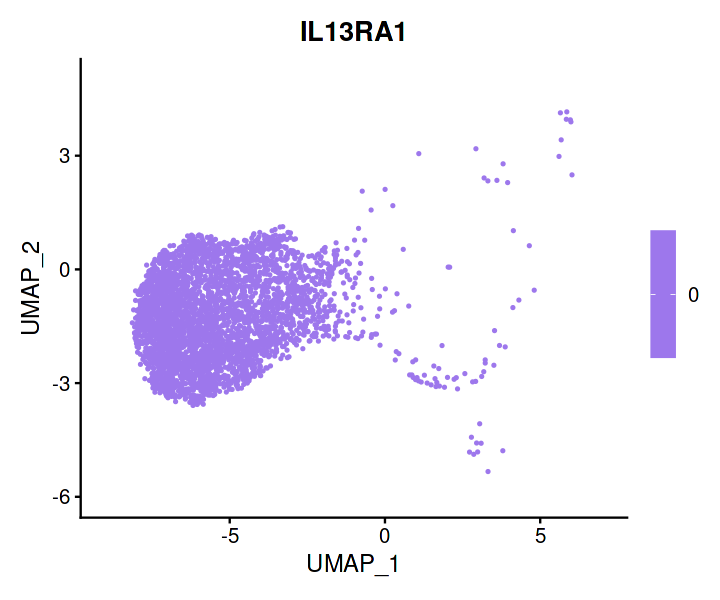

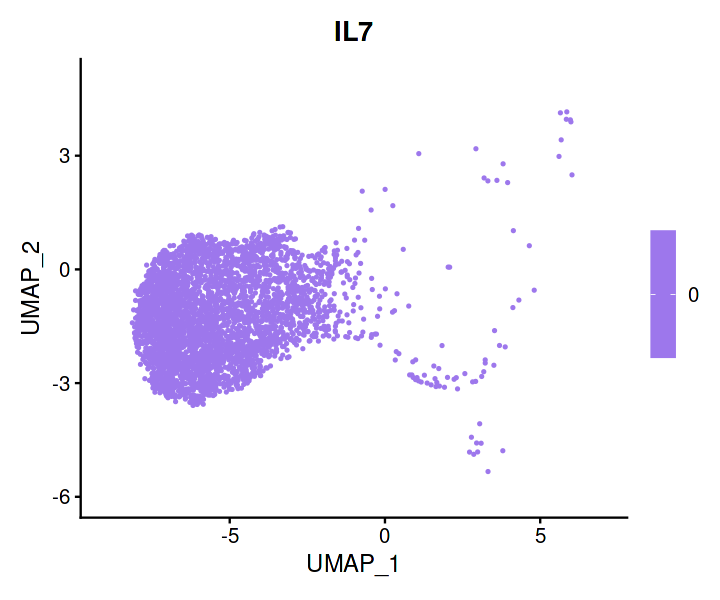

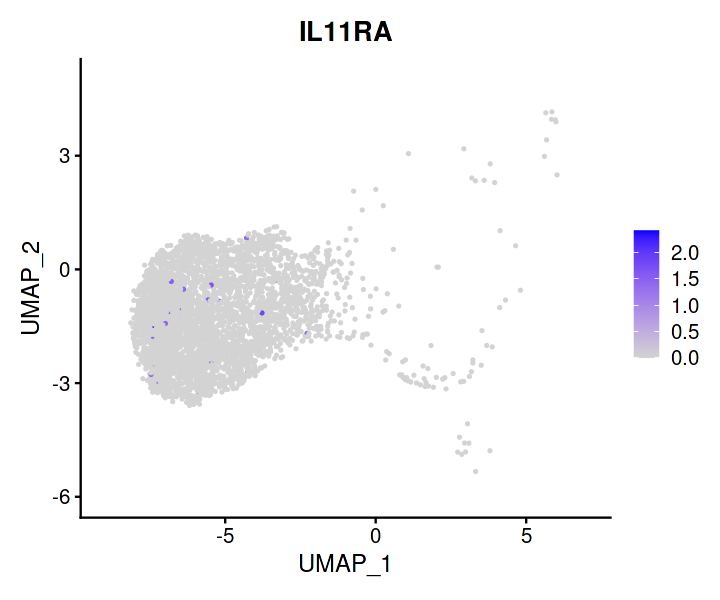

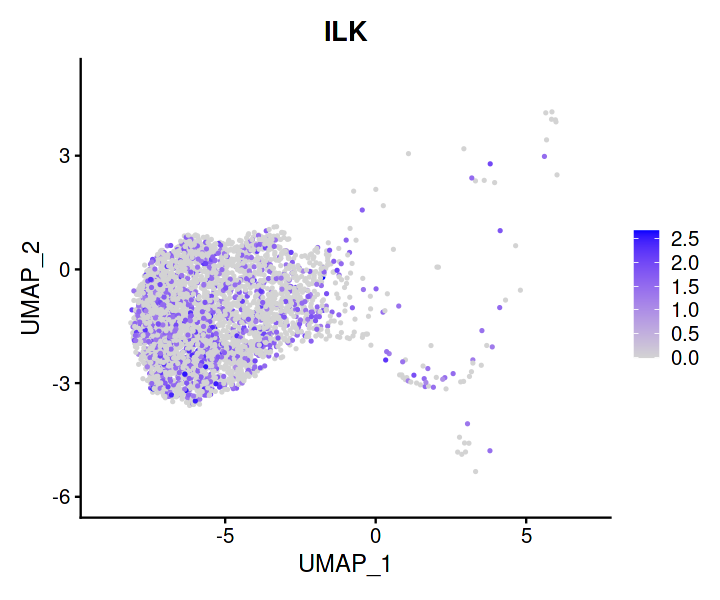

...

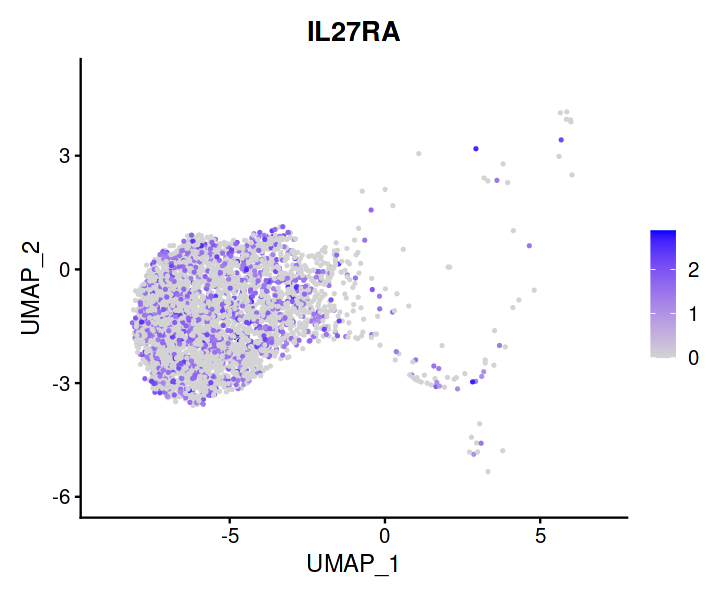

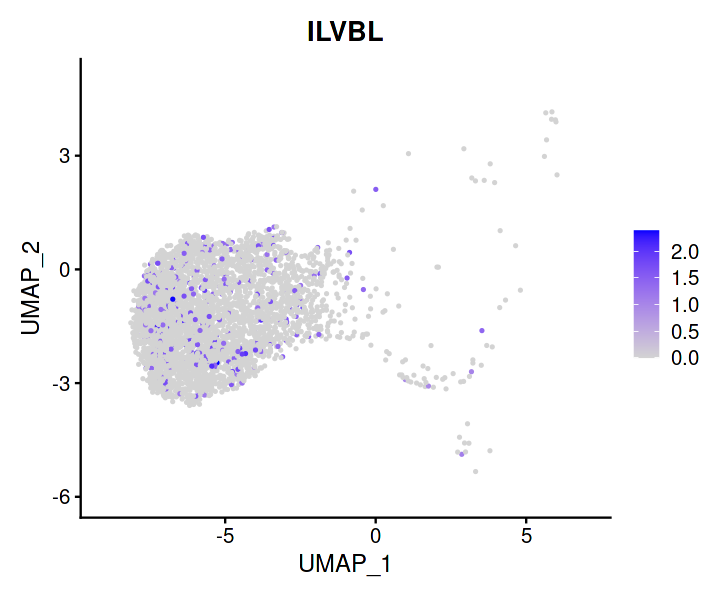

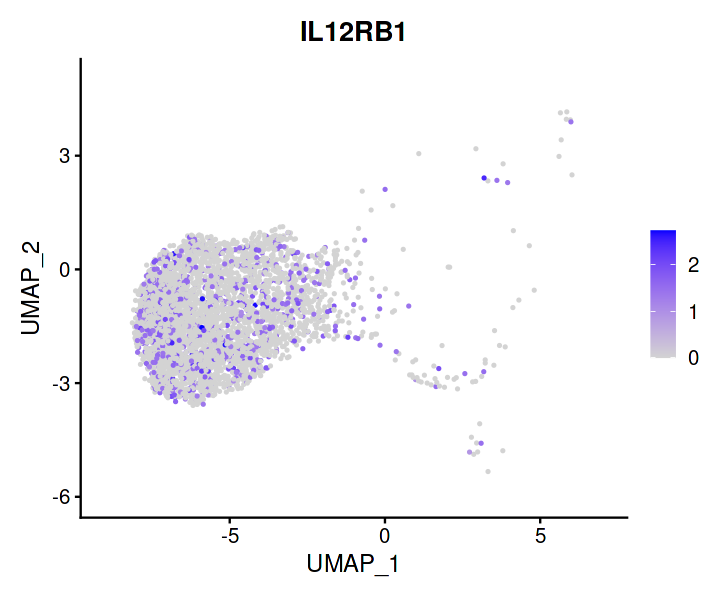

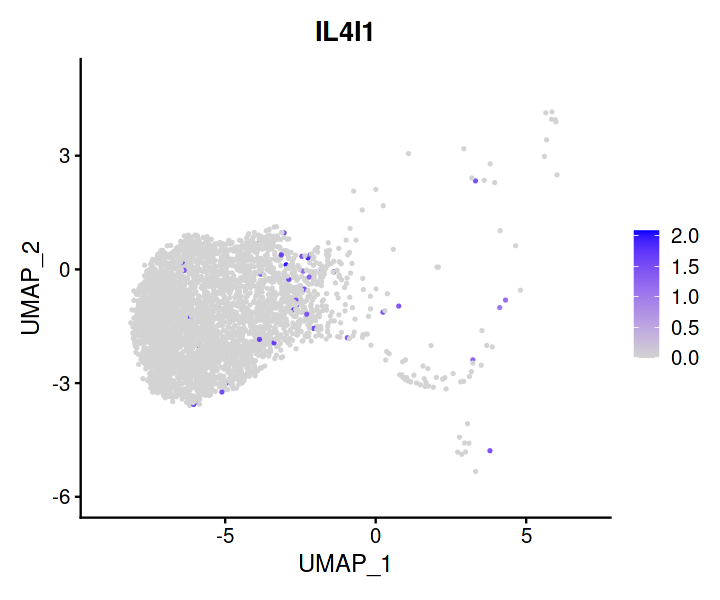

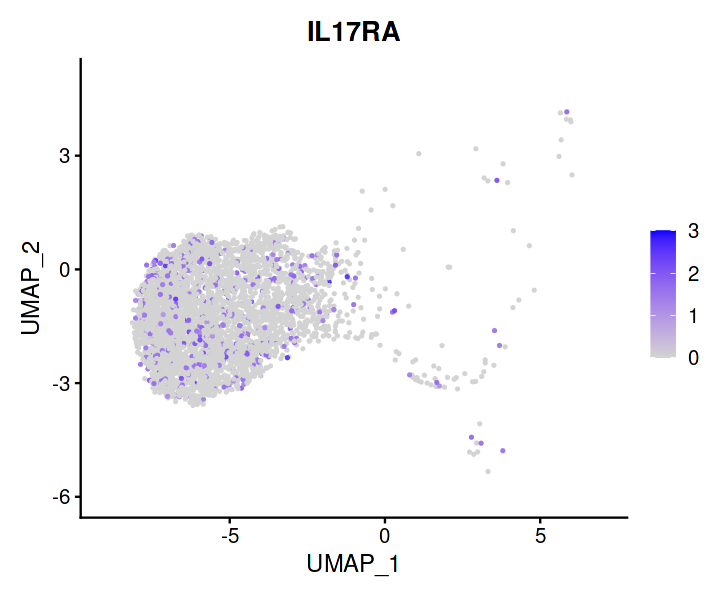

Warning message in FeaturePlot(gd, features = i, min.cutoff = 0):
“All cells have the same value (0) of IL17RB.”


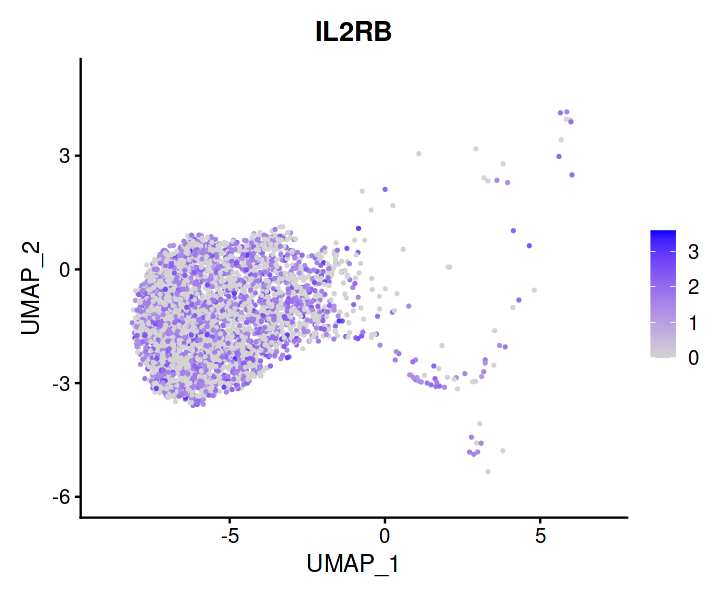

Warning message in FeaturePlot(gd, features = i, min.cutoff = 0):
“All cells have the same value (0) of IL2.”


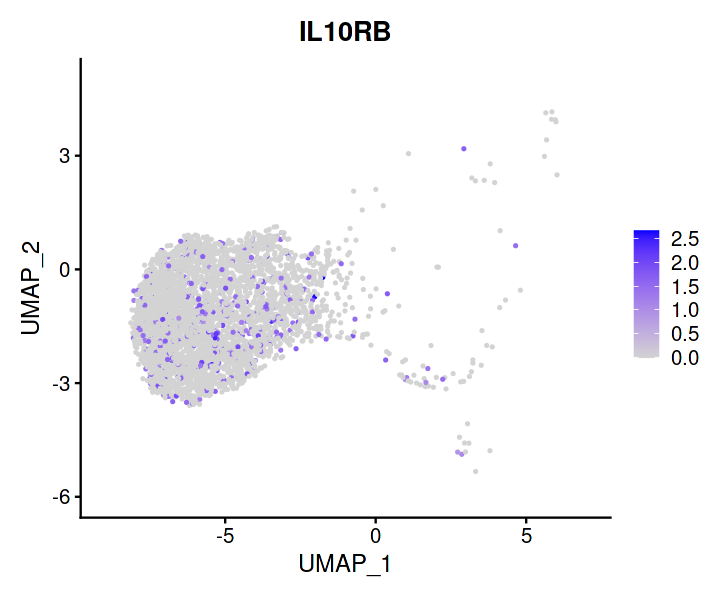

Warning message in FeaturePlot(gd, features = i, min.cutoff = 0):
“All cells have the same value (0) of IL9R.”


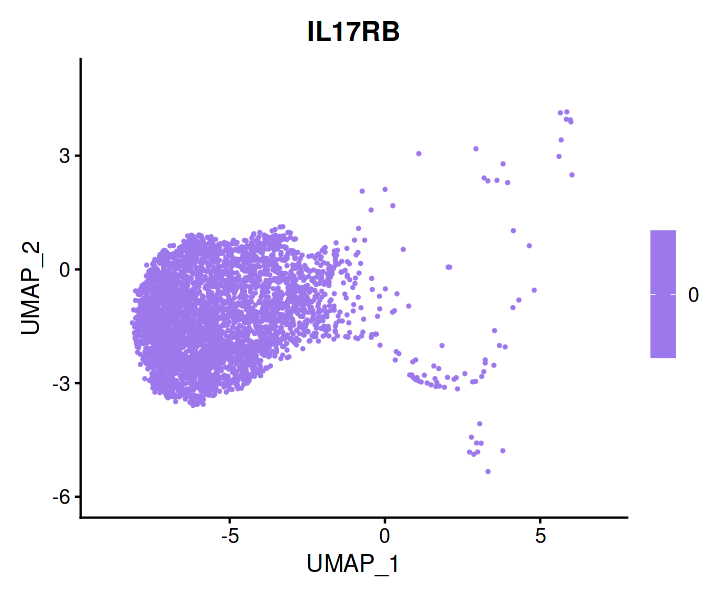

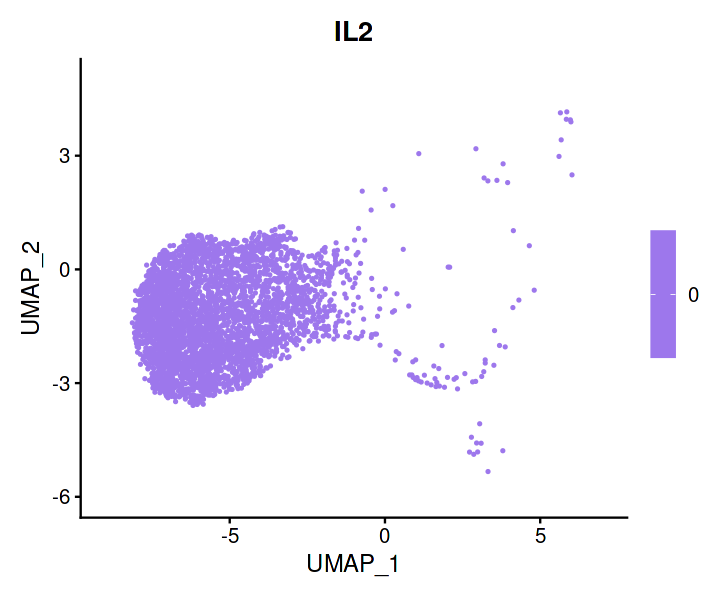

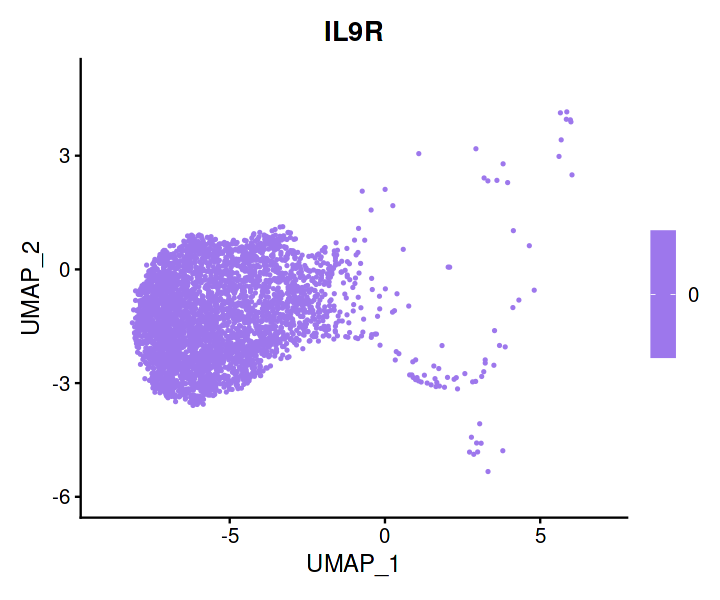

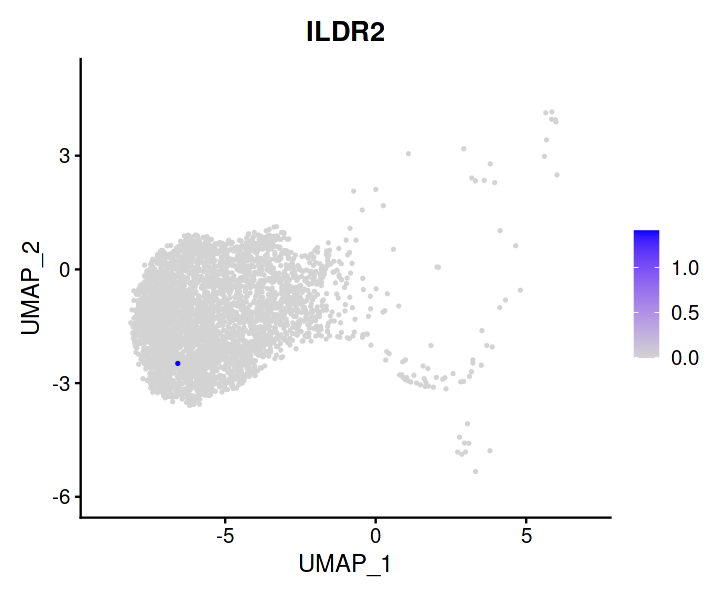

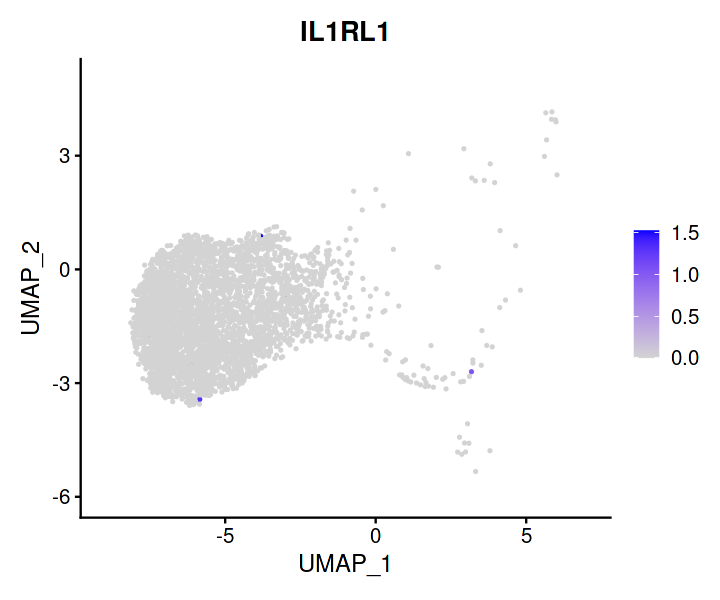

Warning message in FeaturePlot(gd, features = i, min.cutoff = 0):
“All cells have the same value (0) of IL10.”


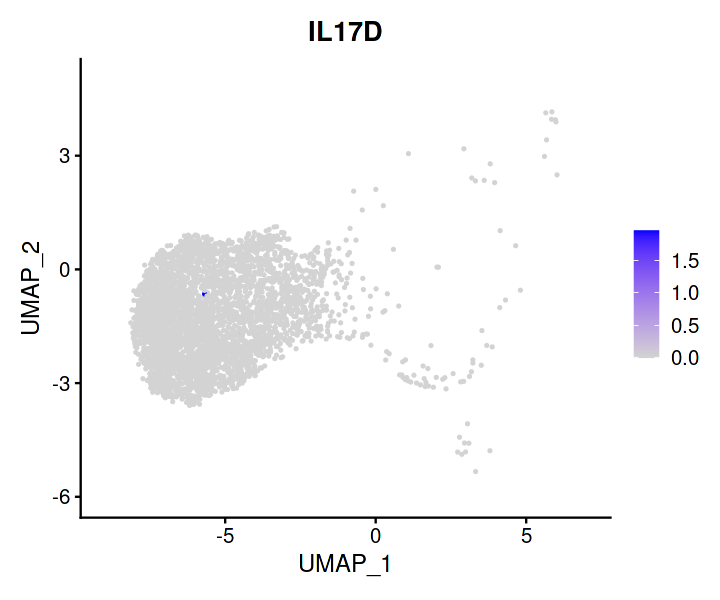

Warning message in FeaturePlot(gd, features = i, min.cutoff = 0):
“All cells have the same value (0) of IL19.”


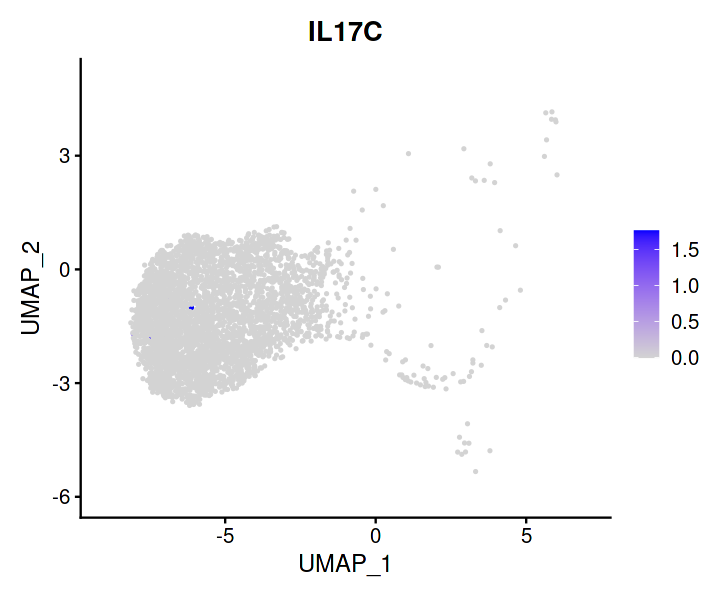

Warning message in FeaturePlot(gd, features = i, min.cutoff = 0):
“All cells have the same value (0) of IL36G.”


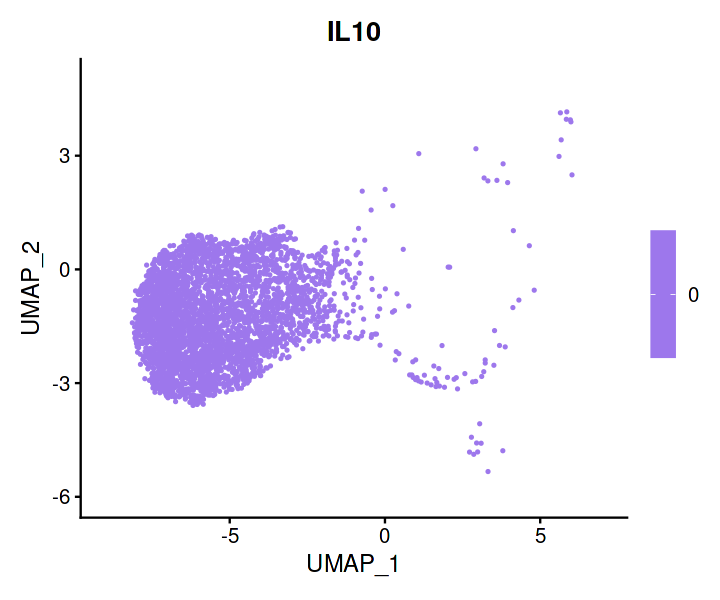

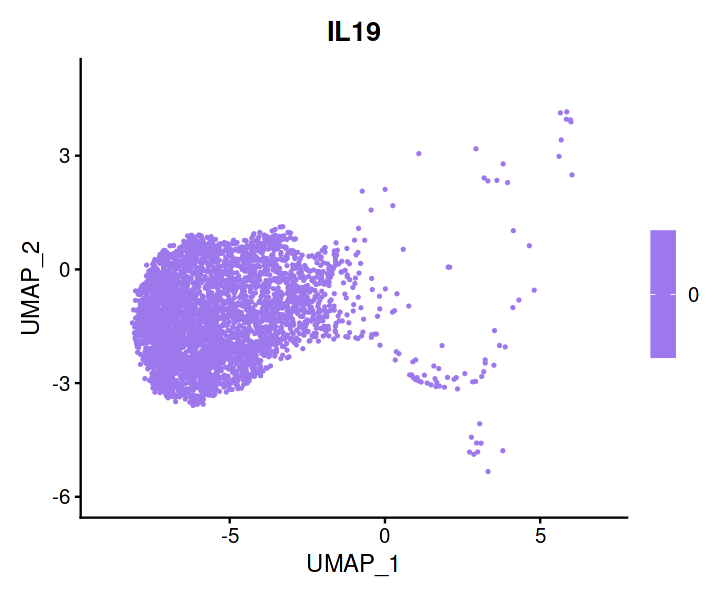

Warning message in FeaturePlot(gd, features = i, min.cutoff = 0):
“All cells have the same value (0) of IL26.”


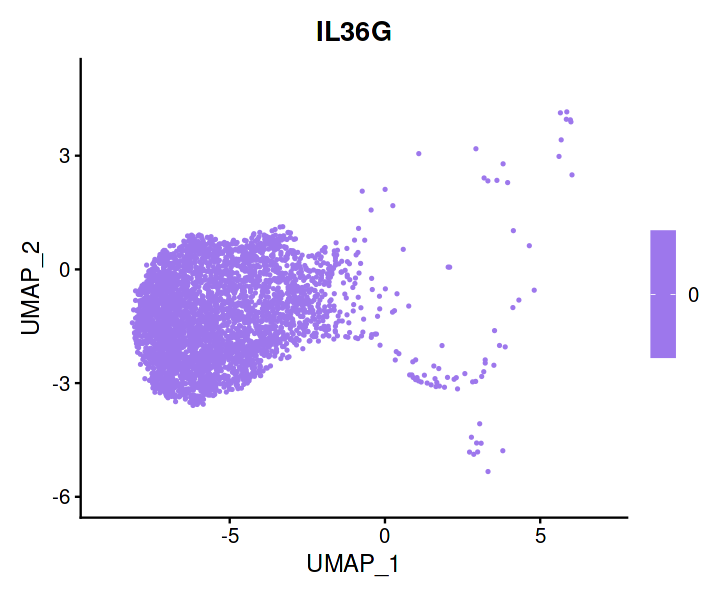

Warning message in FeaturePlot(gd, features = i, min.cutoff = 0):
“All cells have the same value (0) of IL22RA1.”


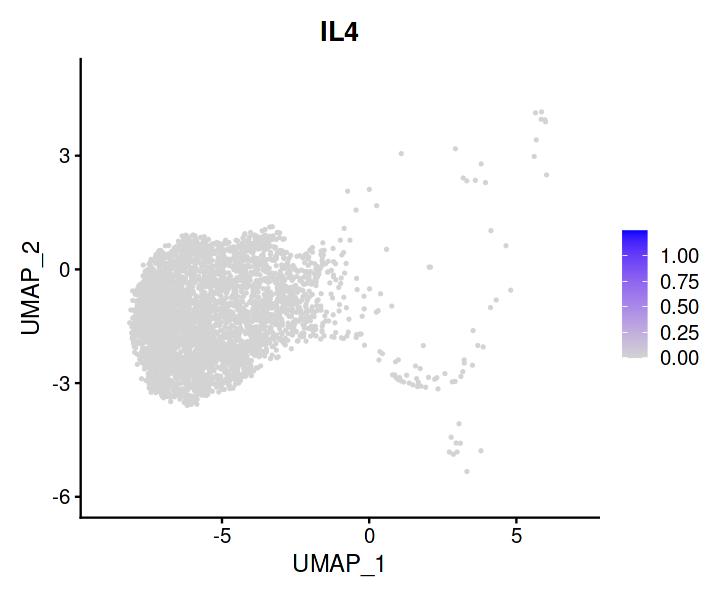

Warning message in FeaturePlot(gd, features = i, min.cutoff = 0):
“All cells have the same value (0) of IL17RD.”


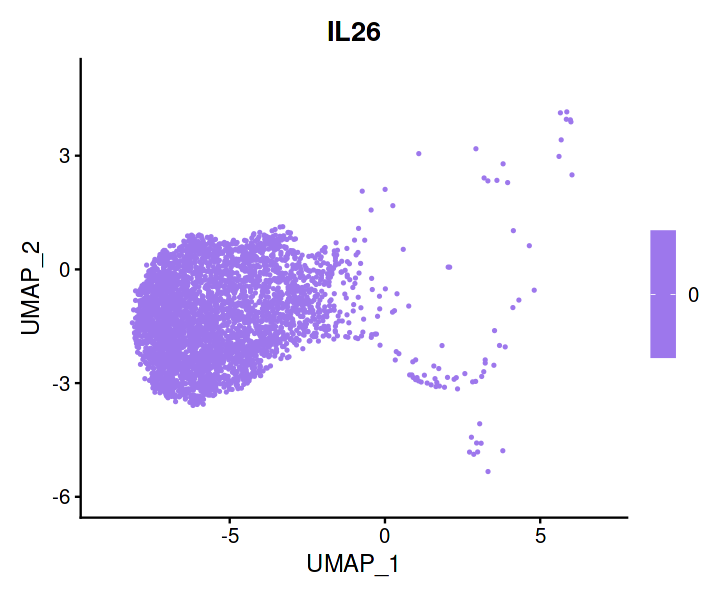

Warning message in FeaturePlot(gd, features = i, min.cutoff = 0):
“All cells have the same value (0) of IL27.”


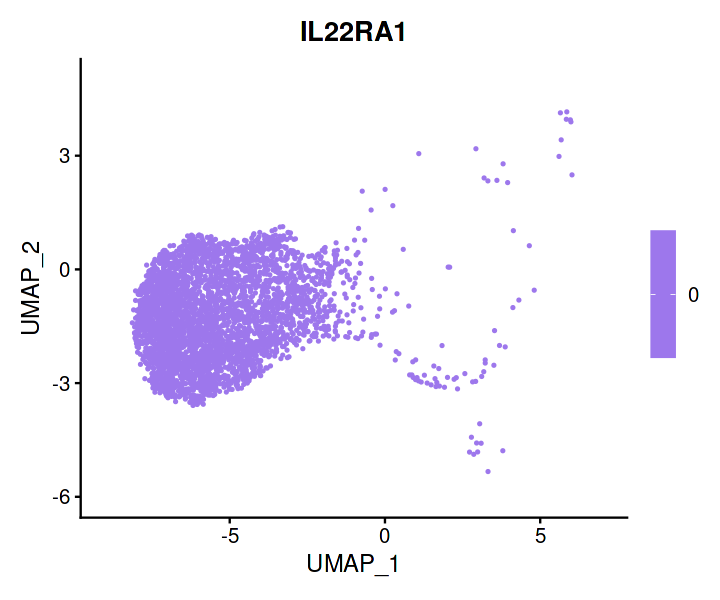

Warning message in FeaturePlot(gd, features = i, min.cutoff = 0):
“All cells have the same value (0) of IL11.”


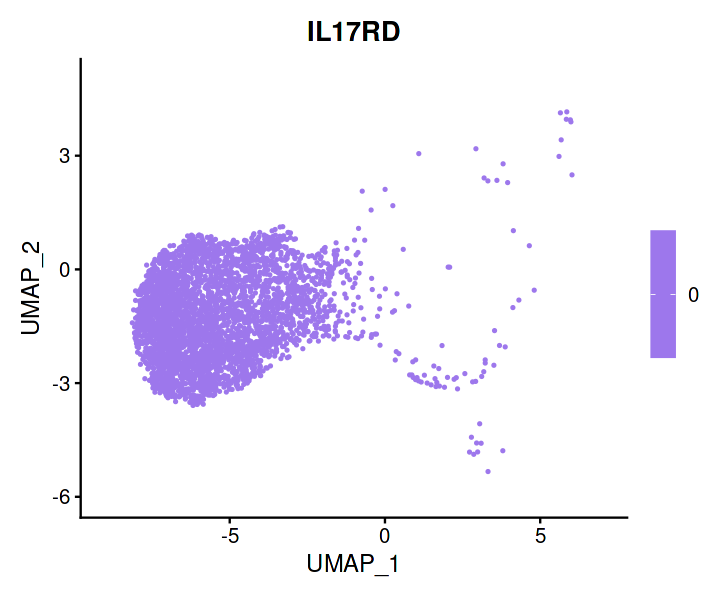

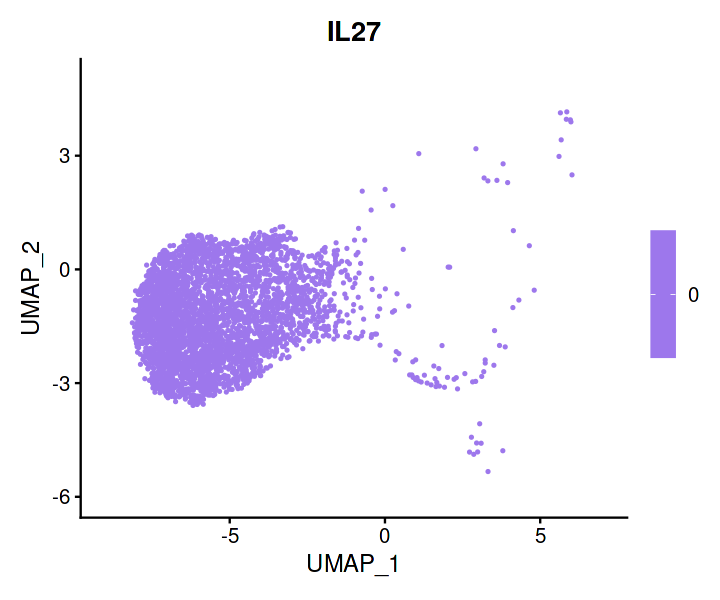

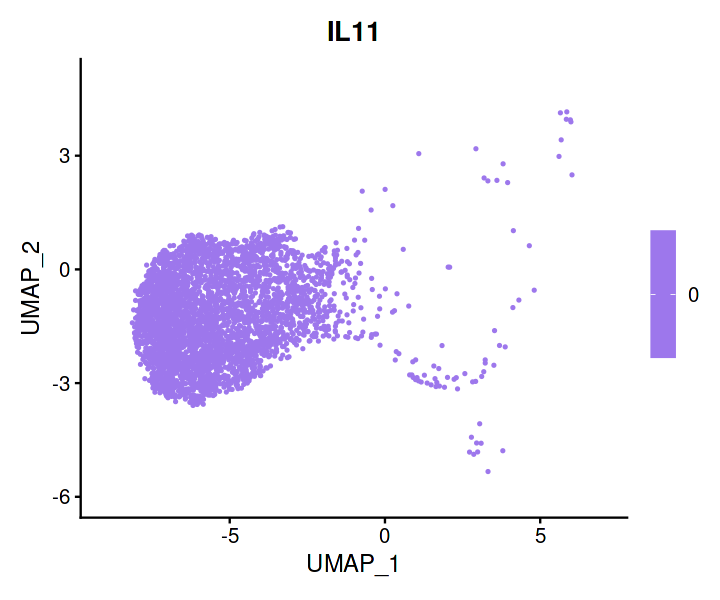

In [58]:
for(i in genes){
    print(FeaturePlot(gd, features = i, min.cutoff = 0))
}

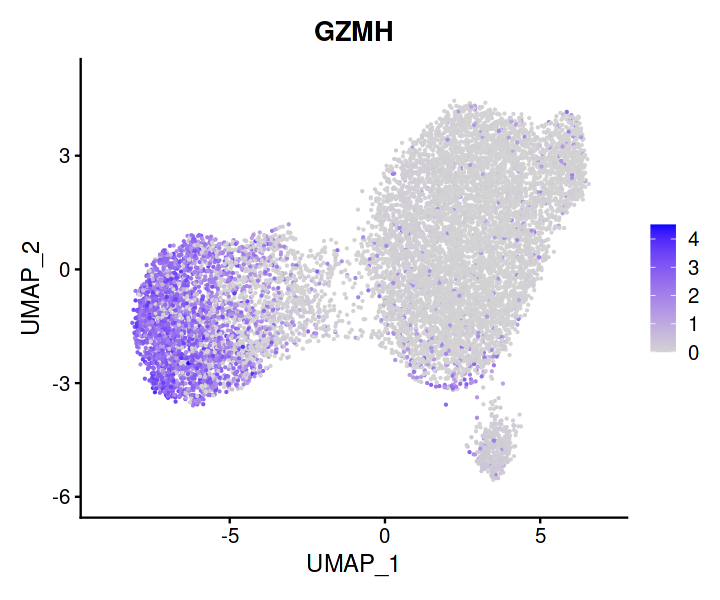

In [38]:
options(repr.plot.width = 6, repr.plot.height = 5)
FeaturePlot(gd, features = "GZMH", min.cutoff = 0)

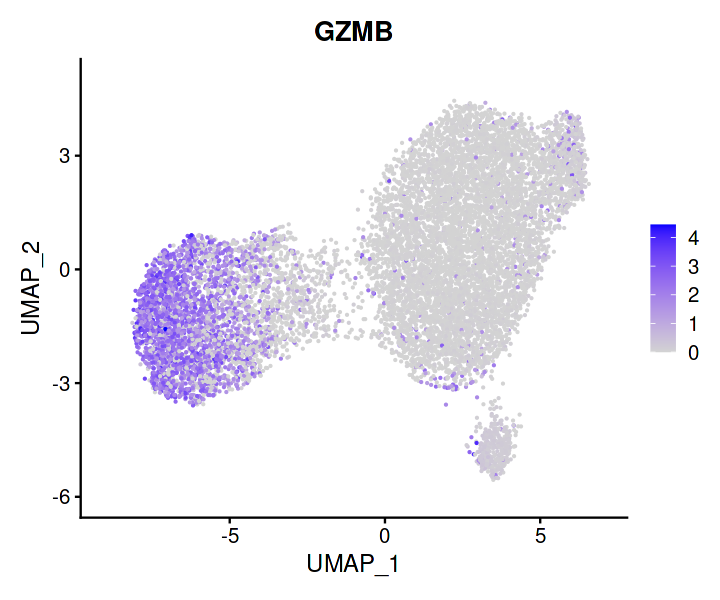

In [39]:
options(repr.plot.width = 6, repr.plot.height = 5)
FeaturePlot(gd, features = "GZMB", min.cutoff = 0)

In [47]:
Idents(gd)  <- gd$annotations_manual

In [58]:
mrk  <- FindAllMarkers(gd, only.pos = T)

Calculating cluster MAIT1: LTB CXCR6 CEBPD

Calculating cluster MAIT2: JUN NFKBIA DUSP1

Calculating cluster CD8Tgd1: FGFBP2 GZMH GZMB

Calculating cluster CD8Tgd2: TRDV2 SELL COTL1

Calculating cluster MAIT3: TENT5C PDE4D CREM

Calculating cluster MAIT4: IFI44L IFI6 MX1



In [50]:
mrk  %>% group_by(cluster)  %>% slice_head(n = 5)

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
4.631997e-234,0.7711414,0.984,0.903,4.631997e-231,MAIT1: LTB CXCR6 CEBPD,LTB
4.855733e-149,0.6933157,0.919,0.831,4.855733e-146,MAIT1: LTB CXCR6 CEBPD,CEBPD
1.258114e-128,0.8004528,0.768,0.729,1.258114e-125,MAIT1: LTB CXCR6 CEBPD,CXCR6
0.000000e+00,1.8499500,0.957,0.759,0.000000e+00,MAIT2: JUN NFKBIA DUSP1,FOS
0.000000e+00,1.4815750,0.967,0.809,0.000000e+00,MAIT2: JUN NFKBIA DUSP1,JUN
0.000000e+00,1.2017881,0.992,0.904,0.000000e+00,MAIT2: JUN NFKBIA DUSP1,DUSP1
1.040207e-201,0.8865998,0.913,0.761,1.040207e-198,MAIT2: JUN NFKBIA DUSP1,NFKBIA
1.370236e-166,0.7322638,0.949,0.853,1.370236e-163,MAIT2: JUN NFKBIA DUSP1,CD69
0.000000e+00,2.9191387,0.883,0.599,0.000000e+00,CD8Tgd1: FGFBP2 GZMH GZMB,FGFBP2
0.000000e+00,2.8452262,0.924,0.634,0.000000e+00,CD8Tgd1: FGFBP2 GZMH GZMB,GZMH


In [55]:
mrk  %>% dplyr::filter(cluster == "CD8Tgd2: TRDV2 SELL COTL1") 

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
TRDV21,0.000000e+00,1.471161,0.966,0.762,0.000000e+00,CD8Tgd2: TRDV2 SELL COTL1,TRDV2
TRGV91,7.692549e-242,1.171325,0.946,0.650,7.692549e-239,CD8Tgd2: TRDV2 SELL COTL1,TRGV9
TRDC1,3.539932e-150,1.164787,0.771,0.668,3.539932e-147,CD8Tgd2: TRDV2 SELL COTL1,TRDC
TRAC,1.555989e-135,1.045132,0.841,0.728,1.555989e-132,CD8Tgd2: TRDV2 SELL COTL1,TRAC
SELL,1.146067e-118,1.032838,0.845,0.718,1.146067e-115,CD8Tgd2: TRDV2 SELL COTL1,SELL


In [59]:
avgexp = AverageExpression(gd, features = rev(str_to_upper(c(
    "LTB","CEBPD","CXCR6","DUSP1","NFKBIA","CTLA4","HAVCR2","PDCD1","PDE4D",
    "TRGC1","CX3CR1","GZMH","GZMB","GZMK","GNLY","CCL4","ITGB2","TENT5C",
    "SELL","CXCR4","IFI44L","IFI6","ISG15","MX1","IL7R","IL1R","KIT","IL23R","TRDC"
    ))), return.seurat = F, 
                           group.by = "annotations_manual", assays = "RNA")

avgexp

library(pheatmap)

Warning message:
“The following 1 features were not found in the RNA assay: IL1R”


,LTB CXCR6 CEBPD_MAIT1,JUN NFKBIA DUSP1_MAIT2,FGFBP2 GZMH GZMB_CD8Tgd1,TRDV2 SELL COTL1_CD8Tgd2,TENT5C PDE4D CREM_MAIT3,IFI44L IFI6 MX1_MAIT4
TRDC,0.13936481,0.07545634,5.223757260,3.710163077,0.22389218,0.19709463
IL23R,0.91966965,0.84173495,0.014276703,0.362676614,0.73985696,0.99360505
KIT,0.03438555,0.06548365,0.001873869,0.006263459,0.05806367,0.02698163
IL7R,31.49596273,35.66013010,12.856790972,22.196026327,36.22133871,36.46593678
MX1,0.71873076,0.60833839,1.118137398,0.894441816,0.64105101,10.92122977
ISG15,2.04619187,1.80498422,2.363548581,1.970990947,1.73614949,16.89223583
IFI6,1.30660051,1.28059085,2.103346206,1.808455379,1.27948544,16.93413862
IFI44L,0.34044103,0.28689953,0.618463653,0.404877792,0.31389095,10.52233892
CXCR4,7.14986031,15.38364257,10.439392476,10.874026535,25.08690986,11.45525260
SELL,1.99746999,2.01987024,5.812337559,7.319129637,2.92258393,4.02572153


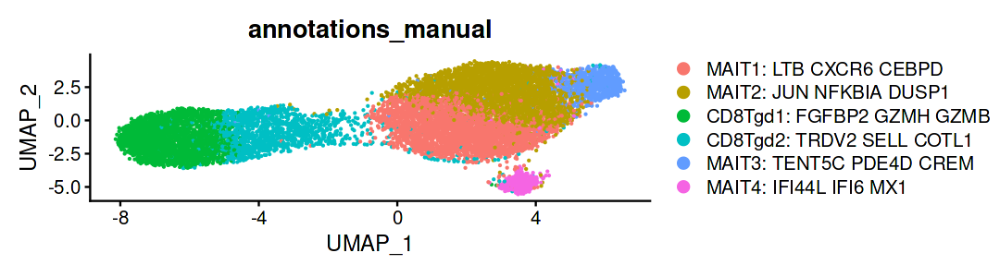

In [43]:
DimPlot(gd, group.by = "annotations_manual")

In [75]:
avgexp = AverageExpression(gd, features = rev(str_to_upper(c(
    "SELL","TRDC","TRGC1","GNLY","CCL4","CX3CR1","GZMB","HAVCR2","CTLA4",
    "GZMK","IL7R","IL23R","LTB","KIT","CXCR6","CEBPD",
    "NFKBIA","DUSP1","TENT5C","CXCR4","PDE4D","MX1","ISG15","IFI44L"
   ))), return.seurat = F, 
                           group.by = "annotations_manual", assays = "RNA")

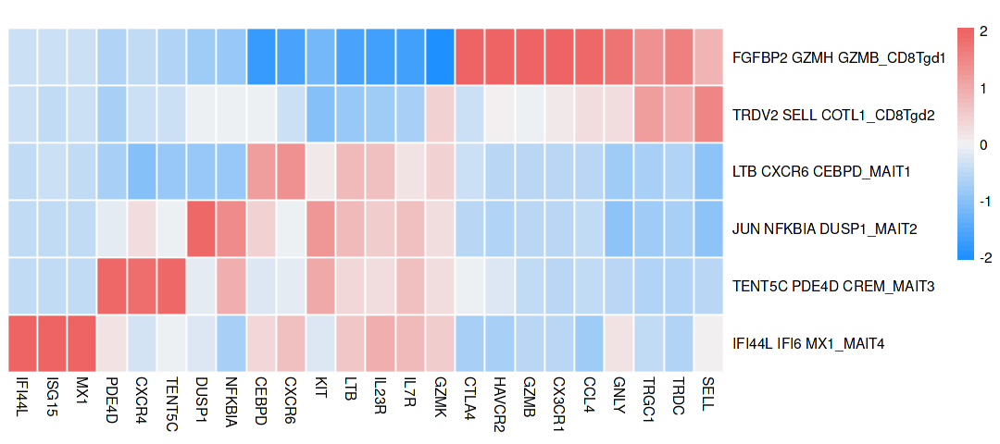

In [76]:
options(repr.plot.width = 9, repr.plot.height = 4)
pheatmap(t(avgexp$RNA)[c(3,4,1,2,5,6),], main = "", scale = "column", cluster_cols = F, cluster_rows = F,
        color=colorRampPalette(c("dodgerblue", "grey95", "indianred2"))(50), 
         border_color = "white", width = 9, height = 3.3,
                  fontsize = 9)

In [78]:
options(repr.plot.width = 9, repr.plot.height = 4)
pheatmap(t(avgexp$RNA)[c(3,4,1,2,5,6),], main = "", scale = "column", cluster_cols = F, cluster_rows = F,
        color=colorRampPalette(c("dodgerblue", "grey95", "indianred2"))(50), 
         border_color = "white", width = 9, height = 3.3,filename = "../figures/heatmaps/heatmap_gd.pdf",
                  fontsize = 9)

# CD4 Temra

## iNKT and CD3-56

In [1]:
cd4_l1_full_filt  <- readRDS("../../240218_VN_Diabetes_V05/data/processed/L1/cd4_l1_full_filt.rds")

In [7]:
library(GEOquery)


Setting options('download.file.method.GEOquery'='auto')

Setting options('GEOquery.inmemory.gpl'=FALSE)



In [8]:
gset <- getGEO("GSE106082", GSEMatrix =TRUE, getGPL=TRUE, AnnotGPL=TRUE)

Found 1 file(s)

GSE106082_series_matrix.txt.gz

Annotation GPL not available, so will use submitter GPL instead



In [9]:
metadata <- data.frame(geo_id = gset$GSE106082_series_matrix.txt.gz$geo_accession,
                       cell_type = gset$GSE106082_series_matrix.txt.gz$`characteristics_ch1.1`
                       )

In [10]:
mtx_tr356  <- read_csv("../../240218_VN_Diabetes_V05/data/published_data/Terrazzano_2020/tr356_df_sum.csv")

New names:
• `` -> `...1`
Rows: 20185 Columns: 14
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (1): SYMBOL
dbl (13): ...1, GSM2829263, GSM2829264, GSM2829265, GSM2829266, GSM2829267, ...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [11]:
mtx_tr356$`...1`  <- NULL

In [12]:
mtx_tr356  <- mtx_tr356  %>% column_to_rownames("SYMBOL")

In [13]:
mtx_tr356

,GSM2829263,GSM2829264,GSM2829265,GSM2829266,GSM2829267,GSM2829268,GSM2829269,GSM2829270,GSM2829271,GSM2829272,GSM2829273,GSM2829274
A1BG,4.544800,4.882145,4.907298,4.596140,4.605788,4.683674,5.221959,4.804293,4.955937,5.185575,5.015142,4.757583
A1CF,3.774098,3.759367,3.850465,3.735124,3.608670,3.628318,3.557054,3.555598,3.949272,4.006079,3.774020,3.284946
A2M,11.862090,9.336823,10.995440,10.445450,6.410524,9.812895,7.742822,7.747147,8.218060,9.741845,11.048080,10.306250
A2ML1,5.742468,6.357774,5.694543,5.473132,5.229849,5.792858,5.598923,5.852253,5.161205,5.162116,5.502660,4.724673
A3GALT2,4.776125,5.317615,4.755690,4.985246,4.823136,4.758044,4.816776,5.256840,4.975574,4.560531,4.971125,4.878799
A4GALT,3.388180,3.838186,3.463689,3.545921,3.690346,3.766155,3.606695,3.768604,3.618593,3.442958,3.223899,3.567720
A4GNT,5.066483,5.482936,4.696154,4.685892,4.532978,4.260944,5.260707,4.657770,4.834064,4.477656,4.134744,4.403499
AAAS,11.217150,10.195850,10.633160,12.039920,11.120950,11.348270,11.414740,10.613370,11.319590,12.366890,12.556400,12.550780
AACS,5.932485,8.543219,7.625425,5.798914,6.403430,6.301892,6.878719,6.896776,6.220037,5.116759,5.846683,5.842064
AACSP1,6.011742,5.394643,5.676650,5.503352,5.544027,5.536304,5.436848,5.260375,5.357204,5.342594,5.629070,5.474391


In [14]:
plan("multisession")

In [15]:
mtx_tr356  <- mtx_tr356  %>% mutate_all(.funs = as.numeric)

In [16]:
mtx_tr356

,GSM2829263,GSM2829264,GSM2829265,GSM2829266,GSM2829267,GSM2829268,GSM2829269,GSM2829270,GSM2829271,GSM2829272,GSM2829273,GSM2829274
A1BG,4.544800,4.882145,4.907298,4.596140,4.605788,4.683674,5.221959,4.804293,4.955937,5.185575,5.015142,4.757583
A1CF,3.774098,3.759367,3.850465,3.735124,3.608670,3.628318,3.557054,3.555598,3.949272,4.006079,3.774020,3.284946
A2M,11.862090,9.336823,10.995440,10.445450,6.410524,9.812895,7.742822,7.747147,8.218060,9.741845,11.048080,10.306250
A2ML1,5.742468,6.357774,5.694543,5.473132,5.229849,5.792858,5.598923,5.852253,5.161205,5.162116,5.502660,4.724673
A3GALT2,4.776125,5.317615,4.755690,4.985246,4.823136,4.758044,4.816776,5.256840,4.975574,4.560531,4.971125,4.878799
A4GALT,3.388180,3.838186,3.463689,3.545921,3.690346,3.766155,3.606695,3.768604,3.618593,3.442958,3.223899,3.567720
A4GNT,5.066483,5.482936,4.696154,4.685892,4.532978,4.260944,5.260707,4.657770,4.834064,4.477656,4.134744,4.403499
AAAS,11.217150,10.195850,10.633160,12.039920,11.120950,11.348270,11.414740,10.613370,11.319590,12.366890,12.556400,12.550780
AACS,5.932485,8.543219,7.625425,5.798914,6.403430,6.301892,6.878719,6.896776,6.220037,5.116759,5.846683,5.842064
AACSP1,6.011742,5.394643,5.676650,5.503352,5.544027,5.536304,5.436848,5.260375,5.357204,5.342594,5.629070,5.474391


In [17]:
ref_tr3_56 <- list(matrix = mtx_tr356, 
                       labels = metadata$cell_type)


In [18]:
ref_tr3_56$matrix  <- as.matrix(ref_tr3_56$matrix)

In [19]:
head(rownames(ref_tr3_56$matrix))

[1] "A1BG"    "A1CF"    "A2M"     "A2ML1"   "A3GALT2" "A4GALT"

In [21]:
remotes::install_version("matrixStats", version = "1.1.0")


Installing package into ‘/home/vercanie/R/x86_64-pc-linux-gnu-library/4.2’
(as ‘lib’ is unspecified)



In [22]:
library(matrixStats)

In [25]:
packageVersion("matrixStats")

[1] ‘1.1.0’

In [23]:
pred <- SingleR(test = cd4_l1_full_filt@assays$RNA@counts, 
                ref = ref_tr3_56$matrix, labels = ref_tr3_56$labels, 
                fine.tune = T, num.threads = 4
       )

ERROR: Error: [matrixStats (>= 1.2.0)] useNames = NA is defunct. Instead, specify either useNames = TRUE or useNames = FALSE. See also ?matrixStats::matrixStats.options


In [ ]:
pred


In [ ]:
cd4_l1_full_filt$singler  <- pred$labels

In [ ]:
DimPlot(cd4_l1_full_filt, group.by = "annotations_l2")

In [ ]:
DimPlot(cd4_l1_full_filt, group.by = "singler", shuffle = T, cols = c("purple","grey88","dodgerblue","red"))

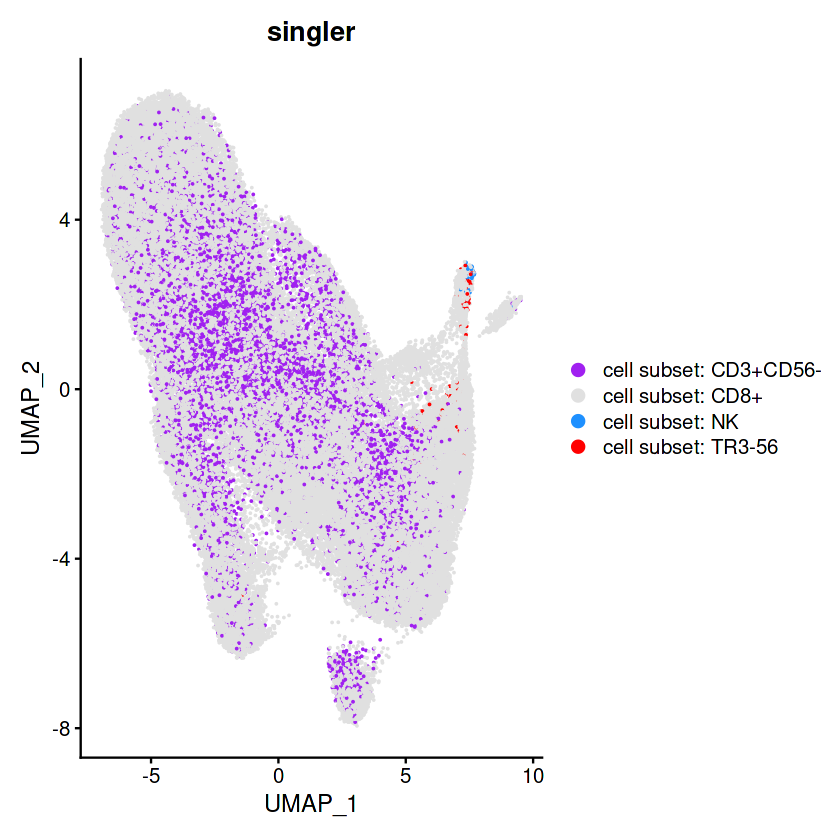

In [28]:
DimPlot(cd4_l1_full_filt, group.by = "singler", shuffle = T, cols = c("purple","grey88","dodgerblue","red"))

In [29]:
test  <- data.frame(annotation = cd4_l1_full_filt$annotations_l2,
                    pred = cd4_l1_full_filt$singler)

In [30]:
df2 <- test %>% group_by(annotation, pred) %>% 
  summarise(n = n()) %>%
  mutate(freq = n / sum(n))

`summarise()` has grouped output by 'annotation'. You can override using the
`.groups` argument.


In [31]:
df2

annotation,pred,n,freq
CD4 T cells---ISAGhi,cell subset: CD3+CD56-,891,2.093023e-01
CD4 T cells---ISAGhi,cell subset: CD8+,3363,7.899930e-01
CD4 T cells---ISAGhi,cell subset: TR3-56,3,7.047216e-04
CD4 T cells---Naive,cell subset: CD3+CD56-,5309,1.978460e-01
CD4 T cells---Naive,cell subset: CD8+,21524,8.021167e-01
CD4 T cells---Naive,cell subset: TR3-56,1,3.726615e-05
CD4 T cells---Nfkb,cell subset: CD3+CD56-,1103,5.851459e-01
CD4 T cells---Nfkb,cell subset: CD8+,781,4.143236e-01
CD4 T cells---Nfkb,cell subset: TR3-56,1,5.305040e-04
CD4 T cells---Proliferating,cell subset: CD3+CD56-,22,1.330913e-02


In [32]:
df2

annotation,pred,n,freq
CD4 T cells---ISAGhi,cell subset: CD3+CD56-,891,2.093023e-01
CD4 T cells---ISAGhi,cell subset: CD8+,3363,7.899930e-01
CD4 T cells---ISAGhi,cell subset: TR3-56,3,7.047216e-04
CD4 T cells---Naive,cell subset: CD3+CD56-,5309,1.978460e-01
CD4 T cells---Naive,cell subset: CD8+,21524,8.021167e-01
CD4 T cells---Naive,cell subset: TR3-56,1,3.726615e-05
CD4 T cells---Nfkb,cell subset: CD3+CD56-,1103,5.851459e-01
CD4 T cells---Nfkb,cell subset: CD8+,781,4.143236e-01
CD4 T cells---Nfkb,cell subset: TR3-56,1,5.305040e-04
CD4 T cells---Proliferating,cell subset: CD3+CD56-,22,1.330913e-02


In [33]:
cd4_l1_full_filt$score_tr356  <- pred$scores[,4]

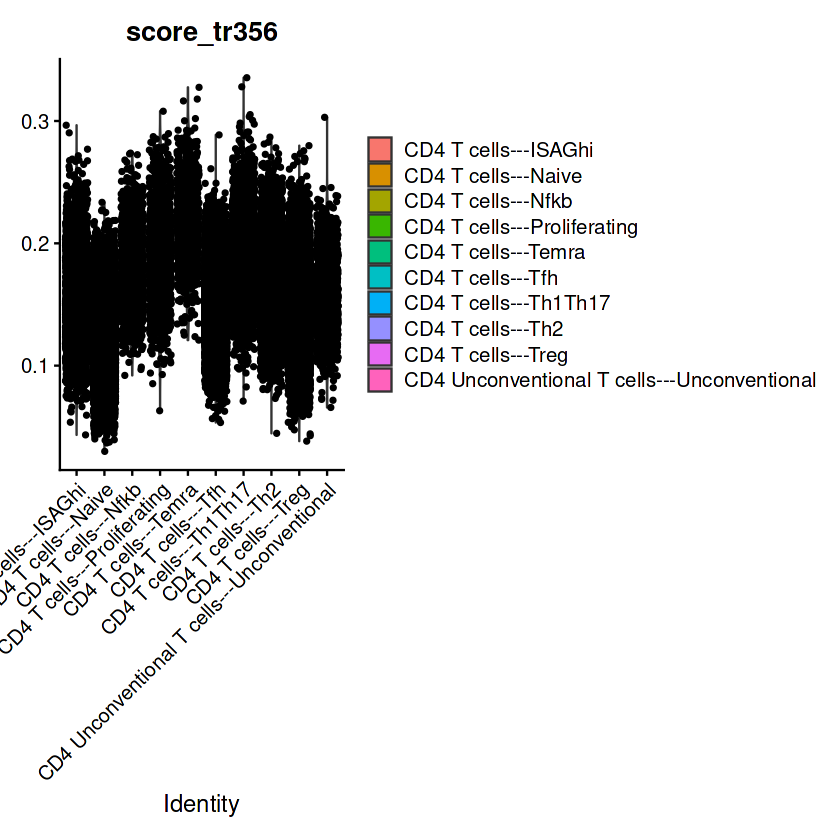

In [34]:
VlnPlot(cd4_l1_full_filt, features = "score_tr356", group.by = "annotations_l2")

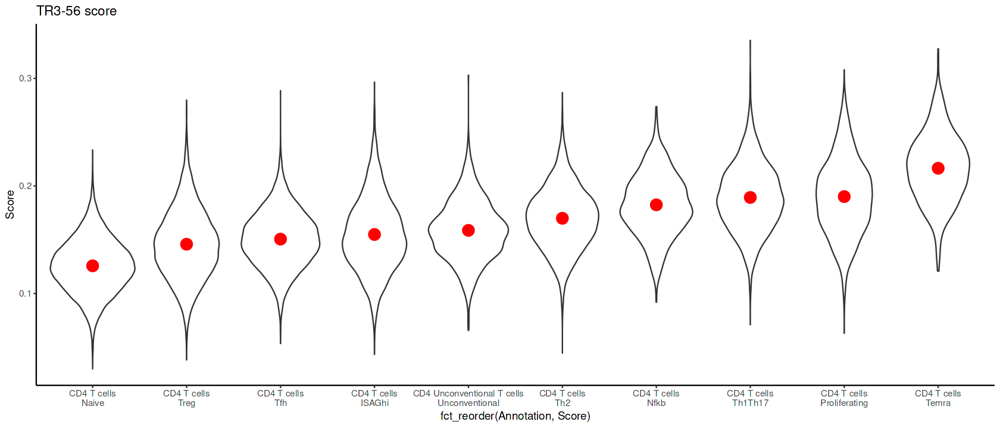

In [42]:
options(repr.plot.width = 14, repr.plot.height = 6)
data.frame(Score = cd4_l1_full_filt$score_tr356,
                  Annotation = gsub(cd4_l1_full_filt$annotations_l2, pattern = "---", replacement = "\n"))  %>% 
#mutate(Annotation = gsub(Annotation, pattern = "cd4 T cells", replacement = ""))  %>% 
#mutate(Annotation = gsub(Annotation, pattern = "cd4 Unconventional T cells", replacement = ""))  %>% 
#mutate(Annotation = gsub(Annotation, pattern = "cd4 NK cells", replacement = ""))  %>% 
ggplot(aes(x = fct_reorder(Annotation, Score), y = Score)) +
  geom_violin() + 
  stat_summary(fun = "mean",
               geom = "point", 
               size = 5,
               colour = "red") + ggtitle("TR3-56 score") + theme_classic()  #ggtheme() + xlab("")

In [ ]:
FeaturePlot(cd4_l1_full_filt, features = "NCAM1", min.cutoff = 0.2)

In [ ]:
DimPlot(cd4_l1_full_filt_l1_full_filt_l1_full_filt)